In [14]:
# S1-1
# Mean Shapley values for a selection of features derived from the AVM model on our test data
import os
import pickle
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np
sns.reset_orig()
matplotlib.rcParams["figure.dpi"] = 300


def plot_average_shap_values(dataset, base_model_version, methods, selected_feature_list):
    results_dir = f"../results/{dataset}/base_model_{base_model_version}"
    shap_values_dict = {}
    
    # Define short names for methods
    method_short_names = {
        'Baseline-0': 'B0',
        'Baseline-median': 'BM',
        'Uniform': 'UF',
        'Conditional-all': 'CA',
        'Marginal-all': 'MA',
        'Marginal-kmeans': 'MK',
        'TreeShap-treepath': 'TS'
    }
    # Load Shapley values for each method
    for method in methods:
        with open(os.path.join(results_dir, f'{method}/shap_values.pkl'), 'rb') as f:
            shap_values_dict[method] = pickle.load(f)
    # Define a color map
    # colors = plt.get_cmap('Set3')(np.linspace(0, 1, len(methods)))
    colors = ['#d73027', '#fc8d59', '#fee090', '#ffffbf', '#e0f3f8', '#91bfdb', '#4575b4']
    
    # Plot individual bar plots for each feature
    for feature in selected_feature_list:
        plt.figure(figsize=(10, 4))
        num_methods = len(methods)
        bar_height = 5 / num_methods  # Adjust height to fill the space
        for idx, (method, shap_values) in enumerate(shap_values_dict.items()):
            shap_values_mean_abs = shap_values.abs.mean(0)
            shap_values_abs = shap_values.abs  # Take absolute values
            shap_values_mean = shap_values_abs.mean(axis=0)
            
            # Extract the mean and standard deviation for the selected feature
            feature_mean = shap_values_mean[feature]
            
            # plt.bar(method, shap_values_mean[feature].values, label=method)
            plt.barh(method_short_names[method], shap_values_mean_abs[feature].values, height=bar_height, 
                     label=method_short_names[method], color=colors[idx],
                    edgecolor='none')
            
            # # Add horizontal bar with error bars
            # plt.barh(method_short_names[method], feature_mean, height=bar_height, 
            #          label=method_short_names[method], color=colors[idx], edgecolor='none',
            #          xerr=feature_std, capsize=5, error_kw={'elinewidth': 1.5, 'alpha': 0.8})
        # Adding method labels manually
        plt.yticks(ticks=range(num_methods), labels=[method_short_names[method] for method in methods], fontsize=14)
        
        plt.ylabel('Methods', fontsize=14)
        plt.xlabel('Mean Absolute Shapley Value', fontsize=14)
        plt.xlim(0, 200000)
        plt.title(f'Feature: {feature}', fontsize=16)
        plt.xticks(fontsize=12)
        # plt.yticks(fontsize=12)
        # plt.legend(fontsize=12)
        plt.gca().invert_yaxis()  # Invert y-axis to maintain order
        # plt.show()
        plt.tight_layout()
        plt.savefig(os.path.join(results_dir, f"feature_imp_{feature}.pdf"))

# Example usage
dataset = "kingcounty"
base_model_version = 'v3'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'Conditional-all', 'TreeShap-treepath']#, 
selected_feature_list = ['grade', 'sqft', 'city_BELLEVUE', 'location_value', 'city_SEATTLE','view_lakewash', 'city_KIRKLAND', 'wfnt']
plot_average_shap_values(dataset, base_model_version, methods, selected_feature_list)

In [13]:
# Example usage
dataset = "polymer"
base_model_version = 'v0'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'TreeShap-treepath']#'Conditional-all', 
selected_feature_list = ["155", "73", "81", "154", "36", "62", "69", "42", "120", "153"]
plot_average_shap_values(dataset, base_model_version, methods, selected_feature_list)

In [15]:
# Example usage
dataset = "hiv"
base_model_version = 'v0'
methods = ['Baseline-0','Baseline-median','Uniform', 'Marginal-kmeans', 'Marginal-all']#'Conditional-all', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'TreeShap-treepath'
selected_feature_list = ["144", "53", "73", "48", "81", "154", "37", "40", "39", "133"]
plot_average_shap_values(dataset, base_model_version, methods, selected_feature_list)

In [17]:
# error bar version
import os
import pickle
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np

sns.reset_orig()
matplotlib.rcParams["figure.dpi"] = 300

def plot_average_shap_values(dataset, base_model_version, methods, selected_feature_list):
    results_dir = f"../results/{dataset}/base_model_{base_model_version}"
    shap_values_dict = {}
    
    # Define short names for methods
    method_short_names = {
        'Baseline-0': 'B0',
        'Baseline-median': 'BM',
        'Uniform': 'UF',
        'Conditional-all': 'CA',
        'Marginal-all': 'MA',
        'Marginal-kmeans': 'MK',
        'TreeShap-treepath': 'TS'
    }
    
    # Load Shapley values for each method
    for method in methods:
        with open(os.path.join(results_dir, f'{method}/shap_values.pkl'), 'rb') as f:
            shap_values_dict[method] = pickle.load(f)
    
    # Define a color map
    colors = ['#d73027', '#fc8d59', '#fee090', '#ffffbf', '#e0f3f8', '#91bfdb', '#4575b4']
    
    # Plot individual bar plots for each feature
    for feature in selected_feature_list:
        plt.figure(figsize=(10, 4))
        num_methods = len(methods)
        bar_height = 5 / num_methods  # Adjust height to fill the space
        
        for idx, (method, shap_values) in enumerate(shap_values_dict.items()):
            # Convert shap_values to a NumPy array
            shap_values_array = shap_values.values
            
            # Calculate mean and standard deviation of absolute Shapley values
            shap_values_abs = np.abs(shap_values_array)
            shap_values_mean = np.mean(shap_values_abs, axis=0)
            shap_values_std = np.std(shap_values_abs, axis=0)
            
            # Extract the mean and standard deviation for the selected feature
            feature_index = shap_values.feature_names.index(feature)
            feature_mean = shap_values_mean[feature_index]
            feature_std = shap_values_std[feature_index]
            
            # Add horizontal bar with error bars
            plt.barh(method_short_names[method], feature_mean, height=bar_height, 
                     label=method_short_names[method], color=colors[idx], edgecolor='none',
                     xerr=feature_std, capsize=5, error_kw={'elinewidth': 1.5, 'alpha': 0.8})
        
        # Adding method labels manually
        plt.yticks(ticks=range(num_methods), labels=[method_short_names[method] for method in methods], fontsize=14)
        plt.ylabel('Methods', fontsize=14)
        plt.xlabel('Mean Absolute Shapley Value', fontsize=14)
        # plt.xlim(0, 200000)
        plt.title(f'Feature: {feature}', fontsize=16)
        plt.xticks(fontsize=12)
        plt.gca().invert_yaxis()  # Invert y-axis to maintain order
        plt.tight_layout()
        plt.savefig(os.path.join(results_dir, f"feature_imp_{feature}_errorbar.pdf"))

# Example usage
dataset = "kingcounty"
base_model_version = 'v3'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'Conditional-all', 'TreeShap-treepath']
selected_feature_list = ['grade', 'sqft', 'city_BELLEVUE', 'location_value', 'city_SEATTLE','view_lakewash', 'city_KIRKLAND', 'wfnt']
plot_average_shap_values(dataset, base_model_version, methods, selected_feature_list)


In [5]:
# box plot version
import os
import pickle
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np

sns.reset_orig()
matplotlib.rcParams["figure.dpi"] = 300

def plot_shap_boxplot_horizontal(dataset, base_model_version, methods, selected_feature_list, clip_percentile=95):
    results_dir = f"../results/{dataset}/base_model_{base_model_version}"
    shap_values_dict = {}

    # Define short names for methods
    method_short_names = {
        'Baseline-0': 'B0',
        'Baseline-median': 'BM',
        'Uniform': 'UF',
        'Conditional-all': 'CA',
        'Marginal-all': 'MA',
        'Marginal-kmeans': 'MK',
        'TreeShap-treepath': 'TS'
    }

    # Load Shapley values for each method
    for method in methods:
        with open(os.path.join(results_dir, f'{method}/shap_values.pkl'), 'rb') as f:
            shap_values_dict[method] = pickle.load(f)

    # Define a color palette
    colors = sns.color_palette("Set2", len(methods))

    # Plot box plots for each feature
    for feature in selected_feature_list:
        plt.figure(figsize=(8, 2.5))
        feature_data = []
        method_labels = []

        for method, shap_values in shap_values_dict.items():
            shap_values_array = shap_values.values
            shap_values_abs = np.abs(shap_values_array)  # Use absolute Shapley values

            # Extract values for the selected feature
            feature_index = shap_values.feature_names.index(feature)
            feature_values = shap_values_abs[:, feature_index]

            # Clip extreme outliers based on the defined percentile
            upper_clip = np.percentile(feature_values, clip_percentile)
            lower_clip = np.percentile(feature_values, 100-clip_percentile)
            feature_values = np.clip(feature_values, lower_clip, upper_clip)

            # Collect data for box plot
            feature_data.append(feature_values)
            method_labels.append(method_short_names[method])

        # Create horizontal boxplot
        sns.boxplot(data=feature_data, palette=colors, orient="h", showfliers=True)

        plt.yticks(ticks=range(len(methods)), labels=method_labels, fontsize=12)
        plt.xticks(fontsize=12)
        plt.xlabel('Absolute Shapley Value', fontsize=14)
        plt.ylabel('Methods', fontsize=14)
        plt.title(f'Feature: {feature}', fontsize=16)
        plt.grid(axis="x", linestyle="--", alpha=0.7)
        # plt.xlim(-1000, 500000)
        plt.tight_layout()

        # Save figure
        plt.savefig(os.path.join(results_dir, f"feature_imp_{feature}_boxplot_horizontal.pdf"))

# Example usage
dataset = "kingcounty"
base_model_version = 'v3'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'Conditional-all', 'TreeShap-treepath']
selected_feature_list = ['grade', 'sqft', 'city_BELLEVUE', 'location_value', 'city_SEATTLE', 'view_lakewash', 'city_KIRKLAND', 'wfnt']
plot_shap_boxplot_horizontal(dataset, base_model_version, methods, selected_feature_list)


In [6]:
# Example usage
dataset = "polymer"
base_model_version = 'v0'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'TreeShap-treepath']#'Conditional-all', 
selected_feature_list = ["155", "73", "81", "154", "36", "62", "69", "42", "120", "153"]
plot_shap_boxplot_horizontal(dataset, base_model_version, methods, selected_feature_list)

In [7]:
# Example usage
dataset = "hiv"
base_model_version = 'v0'
methods = ['Baseline-0','Baseline-median','Uniform', 'Marginal-kmeans', 'Marginal-all']#'Conditional-all', 'Uniform', 'Marginal-kmeans', 'Marginal-all', 'TreeShap-treepath'
selected_feature_list = ["144", "53", "73", "48", "81", "154", "37", "40", "39", "133"]
plot_shap_boxplot_horizontal(dataset, base_model_version, methods, selected_feature_list)

/tmp/ipykernel_65/2759622277.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 2.5))


In [39]:
# # S1-2
# Local shapley values 
import os
import pickle
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.reset_orig()
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300
pd.options.mode.chained_assignment = None
plt.rcParams.update({'font.size': 20})

def round_to_nearest_significant(x, sig=1):
    """
    Round to the nearest significant number of digits.
    """
    if isinstance(x, (list, np.ndarray)):
        return np.array([round_to_nearest_significant(xi, sig) for xi in x])
    if x == 0:
        return 0
    return round(x, -int(np.floor(np.log10(abs(x)))) + (sig - 1))

def plot_shap_wf_plot(save_path, datasetname, df, exp, method_short_name):
    idx = 0
    if datasetname == "kingcounty":
        # Get the values for plotting
        values = np.round(exp[idx].values)
        base_values = np.round(exp[idx].base_values)
        feature_names = exp[idx].feature_names
        data = np.round(exp[idx].data)
    else:
        values = np.round(exp[idx].values, 5)
        base_values = np.round(exp[idx].base_values, 5)
        feature_names = exp[idx].feature_names
        data = np.round(exp[idx].data, 5)

    # # Get the values for plotting
    # values = round_to_nearest_significant(np.abs(exp[idx].values))
    # base_values = round_to_nearest_significant(exp[idx].base_values)
    # feature_names = exp[idx].feature_names
    # data = round_to_nearest_significant(exp[idx].data)
    
    shap.plots.waterfall(shap.Explanation(values=values, base_values=base_values, 
                                          feature_names=feature_names, data=data), show=False)
    
    fig = plt.gcf()
    fig.set_figheight(5)
    fig.set_figwidth(7)
    ax = plt.gca()
    ax.set_xlabel(f"Shapley values for one explicated by {method_short_name} method", fontsize=20)
    ax.set_ylabel(ax.get_ylabel(), fontsize=40)
    ax.axvline(x=340, color='lightgrey')
    ax.grid(color='k', linestyle='-', linewidth=1)
    
    ax.tick_params(colors='k', which='both')
    
    ytick_pos = list(range(len(df.columns))) 
    ax.set_yticks(ytick_pos)
    ax.set_yticklabels([])
    # ax.set_yticklabels([f"{name} = {int(df[name][0])}" if name != 'Other Features' else f"{name}" for name in df.columns][::-1], 
    #                    fontsize=40, color='black')

    
    # Customize colors for positive and negative SHAP values
    default_pos_color = "#ff0051"
    default_neg_color = "#008bfb"
    positive_color = "#67a9cf"
    negative_color = "#ef8a62"
    
    for fc in plt.gcf().get_children():
        for fcc in fc.get_children():
            if isinstance(fcc, matplotlib.patches.FancyArrow):
                if matplotlib.colors.to_hex(fcc.get_facecolor()) == default_pos_color:
                    fcc.set_facecolor(positive_color)
                    fcc.set_edgecolor(positive_color)
                elif matplotlib.colors.to_hex(fcc.get_facecolor()) == default_neg_color:
                    fcc.set_facecolor(negative_color)
                    fcc.set_edgecolor(negative_color)
            elif isinstance(fcc, plt.Text):
                if matplotlib.colors.to_hex(fcc.get_color()) == default_pos_color:
                    fcc.set_color(positive_color)
                elif matplotlib.colors.to_hex(fcc.get_color()) == default_neg_color:
                    fcc.set_color(negative_color)
    
    # plt.show()
    plt.savefig(os.path.join(save_path, f"local_exp_data_0_{method_short_name}_v2.pdf"))
    plt.close()

def plot_local_shap_values(dataset, base_model_version, methods):
    results_dir = f"../results/{dataset}/base_model_{base_model_version}"
    shap_values_dict = {}

    # Load SHAP values from pickle files
    for method in methods:
        with open(os.path.join(results_dir, f'{method}/shap_values.pkl'), 'rb') as f:
            shap_values_dict[method] = pickle.load(f)
    
    # Plot local SHAP values for the first data entry
    for method in methods:
        shap_values = shap_values_dict[method]

        if dataset == 'kingcounty':
            # Extract and round values to the nearest integer:
            shap_values_first_entry = np.round(shap_values[0].values)
            feature_values_first_entry = np.round(shap_values.data[0])
            base_value_first_entry = np.round(shap_values.base_values[0])
        else:
            shap_values_first_entry = np.round(shap_values[0].values, 5)
            feature_values_first_entry = np.round(shap_values.data[0], 5)
            base_value_first_entry = np.round(shap_values.base_values[0], 5)
        
        # Create a DataFrame for the first entry's feature values
        df = pd.DataFrame([feature_values_first_entry], columns=shap_values.feature_names)
        
        # Calculate the absolute SHAP values for ranking
        abs_shap_values = np.abs(shap_values_first_entry)
        
        # Top 9 features by absolute SHAP values
        top_9_idx = np.argsort(abs_shap_values)[-9:][::-1]
        top_9_features = [shap_values.feature_names[i] for i in top_9_idx]
        
        # Other features grouped together as 'Other Features'
        other_idx = np.argsort(abs_shap_values)[:-9]
        other_sum = np.sum(abs_shap_values[other_idx])
        
        # Include 'Other Features' in top 9 features
        if len(other_idx) > 0:
            top_9_features.append('Other Features')
        
        # Using only top 9 features and 'Other Features'
        df_top_9 = df[top_9_features[:9]]
        if len(other_idx) > 0:
            df_top_9['Other Features'] = other_sum
        
        # Updated SHAP values with 'Other Features'
        other_shap_value = np.sum(shap_values_first_entry[other_idx])
        shap_values_top_9 = np.append(shap_values_first_entry[top_9_idx], other_shap_value)
        # print(shap_values_top_9)
        # Ensure the data and feature names match the updated SHAP values
        explainer = shap.Explanation(
            values=np.array([shap_values_top_9]),
            base_values=np.array([base_value_first_entry]),
            data=df_top_9.values,
            feature_names=top_9_features
        )
        
        method_short_names = {
        'Baseline-0': 'B0',
        'Baseline-median': 'BM',
        'Uniform': 'UF',
        'Conditional-all': 'CA',
        'Marginal-all': 'MA',
        'Marginal-kmeans': 'MK',
        'TreeShap-treepath': 'TS',
        'Pairwise-random': 'PR',
        'Pairwise-comps': 'PC', 
        'Pairwise-sim': "PS"
    }
        save_path = os.path.join(results_dir, method)
        plot_shap_wf_plot(save_path, dataset, df_top_9, explainer, method_short_names[method])

# Example usage
dataset = "kingcounty"
base_model_version = 'v3'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 
           'Marginal-kmeans', 'Marginal-all', 'TreeShap-treepath', 'Conditional-all', 
           'Pairwise-comps','Pairwise-sim','Pairwise-random'] #
plot_local_shap_values(dataset, base_model_version, methods)


In [14]:
# Example usage
dataset = "polymer"
base_model_version = 'v0'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 
           'Marginal-kmeans', 'Marginal-all', 'TreeShap-treepath', 
           'Pairwise-sim', 'Pairwise-random'] #'Conditional-all'
plot_local_shap_values(dataset, base_model_version, methods)


In [15]:
# Example usage
dataset = "hiv"
base_model_version = 'v0'
methods = ['Baseline-0', 'Baseline-median', 'Uniform', 
           'Marginal-kmeans', 'Marginal-all', 
           'Pairwise-sim', 'Pairwise-random'] #'Conditional-all', 'TreeShap-treepath'
plot_local_shap_values(dataset, base_model_version, methods)

+-------------------+--------------+-------------------------+--------+-------------+
|    Method Name    | Feature Name |         p-value         |   D    | Effect Size |
+-------------------+--------------+-------------------------+--------+-------------+
|    Baseline-0     |     sqft     |           0.0           | 0.3046 |   39.4848   |
|  Baseline-median  |     sqft     | 1.0901198270637596e-165 | 0.1062 |   13.7752   |
|      Uniform      |     sqft     |  3.083600518431201e-26  | 0.042  |    5.449    |
|  Conditional-all  |     sqft     |           0.0           | 0.2649 |   34.3533   |
|  Marginal-kmeans  |     sqft     |           0.0           | 0.3124 |   40.5072   |
| TreeShap-treepath |     sqft     |  7.818346886894373e-41  | 0.0526 |   6.8174    |
+-------------------+--------------+-------------------------+--------+-------------+

Methods with significantly different distributions compared to 'Marginal-all' (alpha=0.01):
['Baseline-0', 'Baseline-median', 'Uniform', 'C

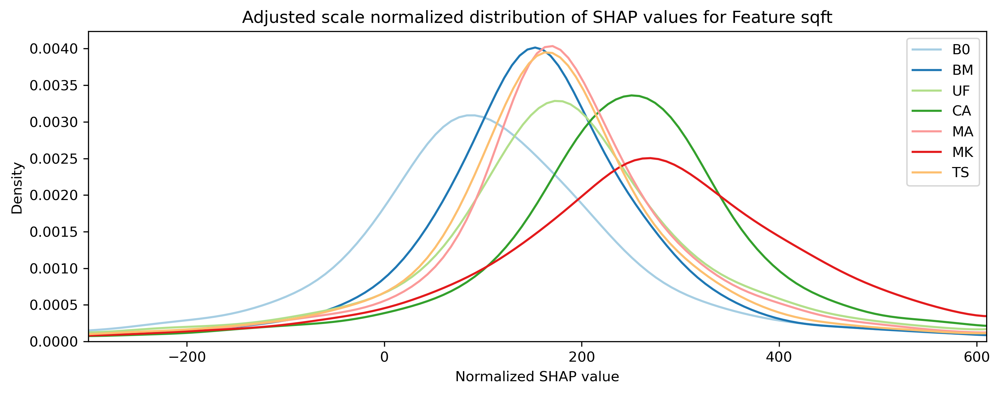

In [5]:
# S2 - 1
# Normalized distribution for Nonpair-wise methods (as well as hypothesis testing)
from post_exp import load_shap_values, compute_normalized_shap_differences
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns
from tabulate import tabulate
import numpy as np
from scipy.stats import ks_2samp, skew, kurtosis
import os
matplotlib.rcParams["figure.dpi"] = 300

dataset = 'kingcounty'
base_model_version = 'v3'
method_short_names = {
        'Baseline-0': 'B0',
        'Baseline-median': 'BM',
        'Uniform': 'UF',
        'Conditional-all': 'CA',
        'Marginal-all': 'MA',
        'Marginal-kmeans': 'MK',1
        'TreeShap-treepath': 'TS'
    }

# Custom color map for seven
# custom_colors = ["#1b9e77","#d95f02","#7570b3","#e7298a","#66a61e","#e6ab02","#a6761d"]
custom_colors = ["#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f"]

# Load SHAP values

shap_paths = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names.keys())))
shap_values_list, feature_values = load_shap_values(shap_paths)

# feature_name list for the specific base model
feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()
num_features = len(feature_names)
# for non-pairwise method, create random pairs and calculate the normalized shapley distribution [This may take a minite]
num_pairs = 50
normalized_diffs, _, _, _ = compute_normalized_shap_differences(shap_values_list, 
                                                                feature_values, 
                                                                list(method_short_names.keys()), 
                                                                feature_names, 
                                                                num_pairs=num_pairs,
                                                                random_seed=42)

# Begin plot - only plot for sqft [modify code below for normalized distribution of other features]
feature_idx = feature_names.index('sqft')
methods_to_plot = list(method_short_names.keys()) 

# Calculate the p-values
comparison_method = 'Marginal-all'
comparison_values = np.clip(normalized_diffs[comparison_method][feature_idx], -700, 700)
n_comparison = len(comparison_values)
p_values = []
for method_name in methods_to_plot:
    if method_name != comparison_method:
        method_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)
        n_method = len(method_values)
        stat, p_value = ks_2samp(comparison_values, method_values)  # Kolmogorov-Smirnov test
        effect_size = stat * np.sqrt((n_comparison * n_method) / (n_comparison + n_method))
        p_values.append([method_name, feature_names[feature_idx], p_value, round(stat, 4), round(effect_size, 4)])
header = ["Method Name", "Feature Name", "p-value", "D", "Effect Size"]
# Print the p-values in a table
print(tabulate(p_values, headers=header, tablefmt="pretty"))
# Indicate the significant methods based on p-value
significant_methods = [method for method, _, p, _ , _ in p_values if p < 0.01]
print("\nMethods with significantly different distributions compared to 'Marginal-all' (alpha=0.01):")
print(significant_methods)

# plot the clipped distribution

plt.figure(figsize=(10, 4))
data = [] # for printing
# header = ["Method Name", "Feature Name", "Mean", "Standard Deviation"]
header = ["Method Name", "Feature Name", "Count", "Mean", "Std", "Min", "25%", "50%", "75%", "Max", "Skew", "Kurtosis"]
for method_idx, method_name in enumerate(methods_to_plot):
    clipped_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)# Clip the SHAP values to the range -700 to 700
    sns.kdeplot(clipped_values, label=method_short_names[method_name], linestyle='-', color=custom_colors[method_idx])
    # # Calculate mean and standard deviation and round them
    # mean_value = np.mean(clipped_values).round(1)
    # std_value = np.std(clipped_values).round(1)
    # data.append([method_name, feature_names[feature_idx], mean_value, std_value])
    
    # Calculate summary statistics
    stats = pd.Series(clipped_values).describe(percentiles=[.25, .5, .75])
    skewness = skew(clipped_values, axis=0, bias=True)
    kurt = kurtosis(clipped_values, axis=0, bias=True)
    stats = pd.concat([stats, pd.Series({'skew': skewness, 'kurtosis': kurt})])

    data.append([method_name, 
                 feature_names[feature_idx],
                 round(stats['count'], 2), 
                 round(stats['mean'], 2), 
                 round(stats['std'], 2), 
                 round(stats['min'], 2), 
                 round(stats['25%'], 2), 
                 round(stats['50%'], 2), 
                 round(stats['75%'], 2), 
                 round(stats['max'], 2), 
                 round(stats['skew'], 2), 
                 round(stats['kurtosis'], 2)])
    
print('\n',tabulate(data, headers=header, tablefmt="pretty"))
plt.xlim(-300, 610) # there are bumps at the clipped boundary
plt.title(f'Adjusted scale normalized distribution of SHAP values for Feature {feature_names[feature_idx]}')
plt.xlabel('Normalized SHAP value')
plt.ylabel('Density')
plt.legend()
plot_path = os.path.join(f"../results/{dataset}/base_model_{base_model_version}", 
                         f'normalized_shap_distribution_{feature_names[feature_idx]}.pdf')
plt.tight_layout() 
# plt.show()
plt.savefig(plot_path)
# plt.close()


+-------------------+--------------+-------------------------+--------+-------------+
|    Method Name    | Feature Name |         p-value         |   D    | Effect Size |
+-------------------+--------------+-------------------------+--------+-------------+
|    Baseline-0     |     sqft     |           0.0           | 0.3046 |   39.4848   |
|  Baseline-median  |     sqft     | 1.0901198270637596e-165 | 0.1062 |   13.7752   |
|      Uniform      |     sqft     |  3.083600518431201e-26  | 0.042  |    5.449    |
|  Conditional-all  |     sqft     |           0.0           | 0.2649 |   34.3533   |
|  Marginal-kmeans  |     sqft     |           0.0           | 0.3124 |   40.5072   |
| TreeShap-treepath |     sqft     |  7.818346886894373e-41  | 0.0526 |   6.8174    |
+-------------------+--------------+-------------------------+--------+-------------+

Methods with significantly different distributions compared to 'Marginal-all' (alpha=0.01):
['Baseline-0', 'Baseline-median', 'Uniform', 'C

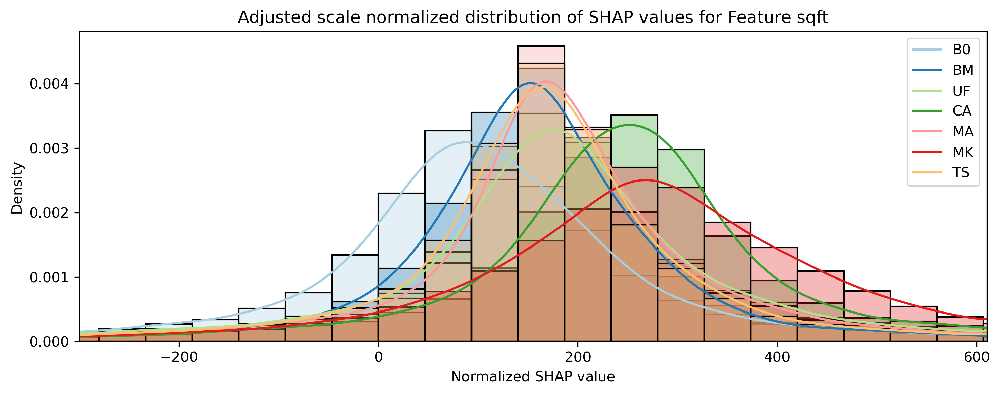


 +-------------------+--------------+---------+--------+--------+--------+--------+--------+--------+-------+-------+----------+
|    Method Name    | Feature Name |  Count  |  Mean  |  Std   |  Min   |  25%   |  50%   |  75%   |  Max  | Skew  | Kurtosis |
+-------------------+--------------+---------+--------+--------+--------+--------+--------+--------+-------+-------+----------+
|    Baseline-0     |     sqft     | 33599.0 | 94.74  | 249.76 | -700.0 | 14.16  | 99.07  | 193.81 | 700.0 | -0.56 |   2.7    |
|  Baseline-median  |     sqft     | 33633.0 | 149.43 | 213.63 | -700.0 | 86.92  | 155.22 | 227.57 | 700.0 | -0.99 |   5.09   |
|      Uniform      |     sqft     | 33604.0 | 169.82 | 264.3  | -700.0 | 98.36  | 180.4  | 272.97 | 700.0 | -0.93 |   2.78   |
|  Conditional-all  |     sqft     | 33617.0 | 233.55 | 244.03 | -700.0 | 169.2  | 250.02 | 329.77 | 700.0 | -1.35 |   4.34   |
|   Marginal-all    |     sqft     | 33635.0 | 172.08 | 238.74 | -700.0 | 116.16 | 177.09 | 256.64 | 7

In [2]:
# S2 - 1 -- Interactive Version with Histogram
# Normalized distribution for Nonpair-wise methods (as well as hypothesis testing)
from post_exp import load_shap_values, compute_normalized_shap_differences
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns
from tabulate import tabulate
import numpy as np
from scipy.stats import ks_2samp, skew, kurtosis
import ipywidgets as widgets
from IPython.display import display

# Setup
matplotlib.rcParams["figure.dpi"] = 300

method_short_names = {
    'Baseline-0': 'B0',
    'Baseline-median': 'BM',
    'Uniform': 'UF',
    'Conditional-all': 'CA',
    'Marginal-all': 'MA',
    'Marginal-kmeans': 'MK',
    'TreeShap-treepath': 'TS'
}
dataset = 'kingcounty'
base_model_version = 'v3'

# Custom color map for seven methods
custom_colors = ["#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f"]

# Load SHAP values
shap_paths = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names.keys())))
shap_values_list, feature_values = load_shap_values(shap_paths)

# Feature name list for the specific base model
feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()
num_features = len(feature_names)

# For non-pairwise method, create random pairs and calculate the normalized Shapley distribution
num_pairs = 50
normalized_diffs, _, _, _ = compute_normalized_shap_differences(shap_values_list, 
                                                                feature_values, 
                                                                list(method_short_names.keys()), 
                                                                feature_names, 
                                                                num_pairs=num_pairs,
                                                                random_seed=42)

# Hypothesis Testing for sqft
feature_idx = feature_names.index('sqft')
methods_to_plot = list(method_short_names.keys())

# Calculate the p-values
comparison_method = 'Marginal-all'
comparison_values = np.clip(normalized_diffs[comparison_method][feature_idx], -700, 700)
n_comparison = len(comparison_values)
p_values = []
for method_name in methods_to_plot:
    if method_name != comparison_method:
        method_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)
        n_method = len(method_values)
        stat, p_value = ks_2samp(comparison_values, method_values)  # Kolmogorov-Smirnov test
        effect_size = stat * np.sqrt((n_comparison * n_method) / (n_comparison + n_method))
        p_values.append([method_name, feature_names[feature_idx], p_value, round(stat, 4), round(effect_size, 4)])
header = ["Method Name", "Feature Name", "p-value", "D", "Effect Size"]
# Print the p-values in a table
print(tabulate(p_values, headers=header, tablefmt="pretty"))

# Indicate the significant methods based on p-value
significant_methods = [method for method, _, p, _, _ in p_values if p < 0.01]
print("\nMethods with significantly different distributions compared to 'Marginal-all' (alpha=0.01):")
print(significant_methods)

# Function to plot the clipped distribution with options for histograms and KDEs
def plot_distributions(selected_methods, show_hist=True, show_kde=True):
    plt.figure(figsize=(10, 4))
    data = []  # for printing
    # header = ["Method Name", "Feature Name", "Mean", "Standard Deviation"]
    header = ["Method Name", "Feature Name", "Count", "Mean", "Std", "Min", "25%", "50%", "75%", "Max", "Skew", "Kurtosis"]
    for method_idx, method_name in enumerate(selected_methods):
        clipped_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)  # Clip the SHAP values to the range -700 to 700
        if show_hist and show_kde:
            sns.histplot(clipped_values, kde=True, stat="density", bins=30, color=custom_colors[methods_to_plot.index(method_name)],
                         line_kws={'linestyle': '-', 'label': method_short_names[method_name]},
                         alpha=0.3, edgecolor='black')
        elif show_hist:
            sns.histplot(clipped_values, kde=False, stat="density", bins=30, color=custom_colors[methods_to_plot.index(method_name)],
                         alpha=0.3, edgecolor='black', label=method_short_names[method_name])
        elif show_kde:
            sns.kdeplot(clipped_values, label=method_short_names[method_name], linestyle='-', color=custom_colors[methods_to_plot.index(method_name)])
        
        # # Calculate mean and standard deviation and round them
        # mean_value = np.mean(clipped_values).round(1)
        # std_value = np.std(clipped_values).round(1)
        # data.append([method_name, feature_names[feature_idx], mean_value, std_value])
        
        # Calculate summary statistics
        stats = pd.Series(clipped_values).describe(percentiles=[.25, .5, .75])
        skewness = skew(clipped_values, axis=0, bias=True)
        kurt = kurtosis(clipped_values, axis=0, bias=True)
        stats = pd.concat([stats, pd.Series({'skew': skewness, 'kurtosis': kurt})])
    
        data.append([method_name, 
                     feature_names[feature_idx],
                     round(stats['count'], 2), 
                     round(stats['mean'], 2), 
                     round(stats['std'], 2), 
                     round(stats['min'], 2), 
                     round(stats['25%'], 2), 
                     round(stats['50%'], 2), 
                     round(stats['75%'], 2), 
                     round(stats['max'], 2), 
                     round(stats['skew'], 2), 
                     round(stats['kurtosis'], 2)])
        
    plt.xlim(-300, 610)
    plt.title(f'Adjusted scale normalized distribution of SHAP values for Feature {feature_names[feature_idx]}')
    plt.xlabel('Normalized SHAP value')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()
    print('\n', tabulate(data, headers=header, tablefmt="pretty"))

# Create checkboxes for each method
checkboxes = [widgets.Checkbox(value=True, description=method_short_names[method_name]) for method_name in methods_to_plot]
hist_checkbox = widgets.Checkbox(value=True, description="Show Histograms")
kde_checkbox = widgets.Checkbox(value=True, description="Show KDEs")
widget_box = widgets.HBox(children=checkboxes)
option_box = widgets.HBox(children=[hist_checkbox, kde_checkbox])

# Function to update plot based on selected checkboxes
def update_plot(*args):
    selected_methods = [method_name for method_name, checkbox in zip(methods_to_plot, checkboxes) if checkbox.value]
    show_hist = hist_checkbox.value
    show_kde = kde_checkbox.value
    plot_distributions(selected_methods, show_hist=show_hist, show_kde=show_kde)

# Attach the update function to each checkbox
for checkbox in checkboxes:
    checkbox.observe(update_plot, 'value')
hist_checkbox.observe(update_plot, 'value')
kde_checkbox.observe(update_plot, 'value')

# Initial plot
update_plot()

# Display checkboxes and options
display(widget_box)
display(option_box)


Comparison method = Pairwise-random:
+-------------------+--------------+------------------------+--------+-------------+
|    Method Name    | Feature Name |        p-value         |   D    | Effect Size |
+-------------------+--------------+------------------------+--------+-------------+
|      Uniform      |     sqft     | 1.402290793788227e-180 | 0.1109 |   14.3809   |
|   Marginal-all    |     sqft     | 6.360171013708188e-115 | 0.0884 |    11.47    |
| TreeShap-treepath |     sqft     | 6.082300289652996e-124 | 0.0919 |   11.9127   |
|  Pairwise-comps   |     sqft     | 0.0004147961337952648  | 0.0159 |   2.0579    |
|   Pairwise-sim    |     sqft     | 0.00015698483390192802 | 0.0167 |   2.1727    |
+-------------------+--------------+------------------------+--------+-------------+

Methods with significantly different distributions compared to 'Pairwise-random' (alpha=0.01):
['Uniform', 'Marginal-all', 'TreeShap-treepath', 'Pairwise-comps', 'Pairwise-sim']

Comparison method

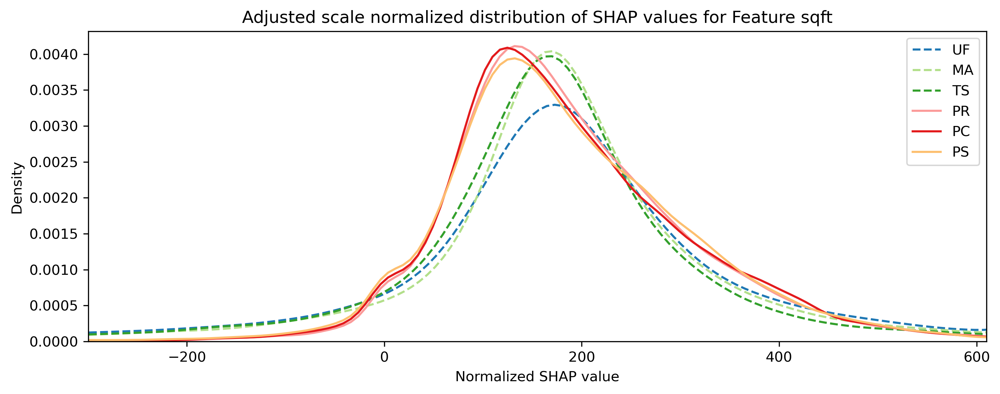

In [11]:
# S2 - 2
# Normalized distribution for Nonpair-wise methods vs pairwise methods (as well as hypothesis testing)
from post_exp import load_shap_values, load_shap_values_pair, compute_normalized_shap_differences, compute_normalized_shap_differences_pairwise
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns
from tabulate import tabulate
import numpy as np
from scipy.stats import ks_2samp,skew, kurtosis
matplotlib.rcParams["figure.dpi"] = 300

method_short_names = {
        # 'Baseline-0': 'B0',
        # 'Baseline-median': 'BM',
        'Uniform': 'UF',
        # 'Conditional-all': 'CA',
        'Marginal-all': 'MA',
        # 'Marginal-kmeans': 'MK',
        'TreeShap-treepath': 'TS',
    }

method_short_names_pairs = {
        'Pairwise-random': 'PR',
        'Pairwise-comps': 'PC', 
        'Pairwise-sim': "PS"
    }
dataset = 'kingcounty'
base_model_version = 'v3'


# Custom color map for six
# custom_colors = ["#66c2a5","#fc8d62","#8da0cb","#e78ac3","#a6d854","#ffd92f"]
custom_colors = ["#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f"]

# Load SHAP values
shap_paths = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names.keys())))
shap_paths_pair = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names_pairs.keys())))
shap_values_list, feature_values = load_shap_values(shap_paths)
shap_values_list_pair, feature_values_pair = load_shap_values_pair(shap_paths_pair)

# feature_name list for the specific base model
feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()
num_features = len(feature_names)

# for non-pairwise method, create random pairs and calculate the normalized shapley distribution [This may take a minite]
num_pairs = 50
normalized_diffs, _, _, _ = compute_normalized_shap_differences(shap_values_list, 
                                                                feature_values, 
                                                                list(method_short_names.keys()), 
                                                                feature_names, 
                                                                num_pairs=num_pairs,
                                                                random_seed=42)
normalized_diffs_pair = compute_normalized_shap_differences_pairwise(shap_values_list_pair, 
                                                                     feature_values_pair, 
                                                                     list(method_short_names_pairs.keys()),)
# combine two dicts into one
normalized_diffs.update(normalized_diffs_pair)

# Begin plot - only plot for sqft [modify code below for normalized distribution of other features]
feature_idx = feature_names.index('sqft')
methods_to_plot = list(method_short_names.keys()) + list(method_short_names_pairs.keys())

# Calculate the p-values
# comparison_method = 'Pairwise-random'
for comparison_method in list(method_short_names_pairs.keys()):
    print(f"\nComparison method = {comparison_method}:")
    comparison_values = np.clip(normalized_diffs[comparison_method][feature_idx], -700, 700)
    p_values = []
    n_comparison = len(comparison_values)
    for method_name in methods_to_plot:
        if method_name != comparison_method:
            method_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)
            n_method = len(method_values)
            stat, p_value = ks_2samp(comparison_values, method_values)  # Kolmogorov-Smirnov test
            effect_size = stat * np.sqrt((n_comparison * n_method) / (n_comparison + n_method))
            p_values.append([method_name, feature_names[feature_idx], p_value, round(stat, 4), round(effect_size, 4)])
    header = ["Method Name", "Feature Name", "p-value", "D", "Effect Size"]
    # Print the p-values in a table
    print(tabulate(p_values, headers=header, tablefmt="pretty"))
    # Indicate the significant methods based on p-value
    significant_methods = [method for method, _, p, _ , _ in p_values if p < 0.01]
    print("\nMethods with significantly different distributions compared to 'Pairwise-random' (alpha=0.01):")
    print(significant_methods)


# plot the clipped distribution
plt.figure(figsize=(10, 4))
data = [] # for printing
# header = ["Method Name", "Feature Name", "Mean", "Standard Deviation"]
header = ["Method Name", "Feature Name", "Count", "Mean", "Std", "Min", "25%", "50%", "75%", "Max", "Skew", "Kurtosis"]
for method_idx, method_name in enumerate(methods_to_plot):
    clipped_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)# Clip the SHAP values to the range -700 to 700
    if method_name in list(method_short_names.keys()):
        sns.kdeplot(clipped_values, label=method_short_names[method_name], linestyle='--', color=custom_colors[method_idx])
    else:
        sns.kdeplot(clipped_values, label=method_short_names_pairs[method_name], linestyle='-', color=custom_colors[method_idx])
    
    # # Calculate mean and standard deviation and round them
    # mean_value = np.mean(clipped_values).round(1)
    # std_value = np.std(clipped_values).round(1)
    # data.append([method_name, feature_names[feature_idx], mean_value, std_value])

    # Calculate summary statistics
    stats = pd.Series(clipped_values).describe(percentiles=[.25, .5, .75])
    skewness = skew(clipped_values, axis=0, bias=True)
    kurt = kurtosis(clipped_values, axis=0, bias=True)
    stats = pd.concat([stats, pd.Series({'skew': skewness, 'kurtosis': kurt})])

    data.append([method_name, 
                 feature_names[feature_idx],
                 round(stats['count'], 2), 
                 round(stats['mean'], 2), 
                 round(stats['std'], 2), 
                 round(stats['min'], 2), 
                 round(stats['25%'], 2), 
                 round(stats['50%'], 2), 
                 round(stats['75%'], 2), 
                 round(stats['max'], 2), 
                 round(stats['skew'], 2), 
                 round(stats['kurtosis'], 2)])


print('\n',tabulate(data, headers=header, tablefmt="pretty"))
plt.xlim(-300, 610) # there are bumps at the clipped boundary
plt.title(f'Adjusted scale normalized distribution of SHAP values for Feature {feature_names[feature_idx]}')
plt.xlabel('Normalized SHAP value')
plt.ylabel('Density')
plt.legend()
# plot_path = os.path.join(output_dir, f'normalized_shap_distribution_{feature_names[feature_idx]}_adjusted_submethods.png')
plt.tight_layout() 
plt.show()
# plt.savefig(plot_path)
# plt.close()



Comparison method = Pairwise-random:
+-------------------+--------------+-------------------------+--------+-------------+
|    Method Name    | Feature Name |         p-value         |   D    | Effect Size |
+-------------------+--------------+-------------------------+--------+-------------+
|      Uniform      |     sqft     | 1.4667836320279543e-175 | 0.1093 |   14.1796   |
|   Marginal-all    |     sqft     | 3.471458272847137e-110  | 0.0866 |   11.2306   |
| TreeShap-treepath |     sqft     | 3.373206259400328e-129  | 0.0938 |   12.163    |
|  Pairwise-comps   |     sqft     | 2.5851348840264275e-05  | 0.0183 |    2.371    |
+-------------------+--------------+-------------------------+--------+-------------+

Methods with significantly different distributions compared to 'Pairwise-random' (alpha=0.01):
['Uniform', 'Marginal-all', 'TreeShap-treepath', 'Pairwise-comps']

Comparison method = Pairwise-comps:
+-------------------+--------------+-------------------------+--------+---

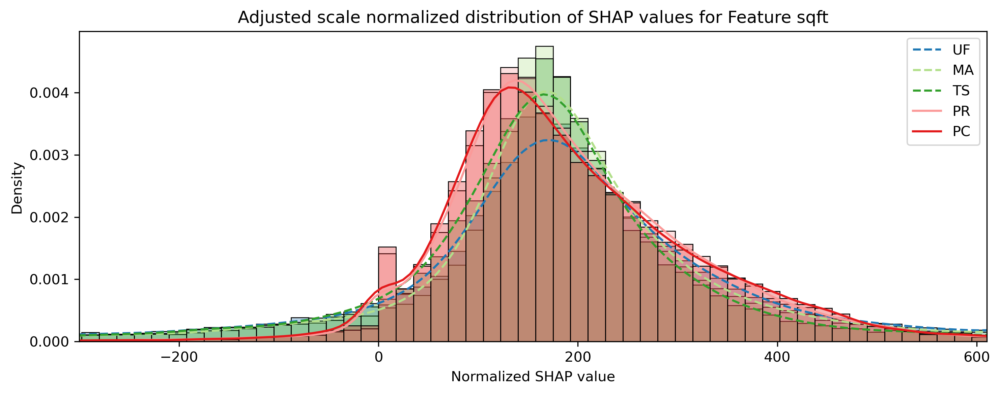


 +-------------------+--------------+---------+--------+--------+--------+--------+--------+--------+-------+-------+----------+
|    Method Name    | Feature Name |  Count  |  Mean  |  Std   |  Min   |  25%   |  50%   |  75%   |  Max  | Skew  | Kurtosis |
+-------------------+--------------+---------+--------+--------+--------+--------+--------+--------+-------+-------+----------+
|      Uniform      |     sqft     | 33599.0 | 174.66 | 269.59 | -700.0 | 103.82 | 182.61 | 283.65 | 700.0 | -0.99 |   2.8    |
|   Marginal-all    |     sqft     | 33633.0 | 175.2  | 242.11 | -700.0 | 118.85 | 178.91 | 261.67 | 700.0 | -1.1  |   4.03   |
| TreeShap-treepath |     sqft     | 33604.0 | 160.08 | 231.05 | -700.0 | 100.08 | 168.81 | 240.99 | 700.0 | -1.0  |   4.27   |
|  Pairwise-random  |     sqft     | 33670.0 | 196.43 | 139.91 | -700.0 | 114.34 | 174.44 | 264.81 | 700.0 | 0.34  |   3.98   |
|  Pairwise-comps   |     sqft     | 33408.0 | 194.61 | 141.43 | -700.0 | 110.74 | 172.1  | 265.01 | 7

In [38]:
# S2 - 2 -- Interactive Version with Histogram
# Normalized distribution for Nonpair-wise methods vs pairwise methods (as well as hypothesis testing)
from post_exp import load_shap_values, load_shap_values_pair, compute_normalized_shap_differences, compute_normalized_shap_differences_pairwise
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns
from tabulate import tabulate
import numpy as np
from scipy.stats import ks_2samp, skew, kurtosis
import ipywidgets as widgets
from IPython.display import display

# Setup
matplotlib.rcParams["figure.dpi"] = 300

method_short_names = {
    'Uniform': 'UF',
    'Marginal-all': 'MA',
    'TreeShap-treepath': 'TS',
}

method_short_names_pairs = {
    'Pairwise-random': 'PR',
    'Pairwise-comps': 'PC', 
    'Pairwise-sim': "PS"
}
dataset = 'kingcounty'
base_model_version = 'v3'
# Custom color map for six methods
custom_colors = ["#1f78b4", "#b2df8a", "#33a02c", "#fb9a99", "#e31a1c", "#fdbf6f"]

# Load SHAP values
shap_paths = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names.keys())))
shap_paths_pair = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names_pairs.keys())))
shap_values_list, feature_values = load_shap_values(shap_paths)
shap_values_list_pair, feature_values_pair = load_shap_values_pair(shap_paths_pair)

# Feature name list for the specific base model
feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()
num_features = len(feature_names)

# For non-pairwise methods, create random pairs and calculate the normalized Shapley distribution
num_pairs = 50
normalized_diffs, _, _, _ = compute_normalized_shap_differences(shap_values_list, 
                                                                feature_values, 
                                                                list(method_short_names.keys()), 
                                                                feature_names, 
                                                                num_pairs=num_pairs,
                                                                random_seed=42)

# For pairwise methods, compute the normalized Shapley differences
normalized_diffs_pair = compute_normalized_shap_differences_pairwise(shap_values_list_pair, 
                                                                     feature_values_pair, 
                                                                     list(method_short_names_pairs.keys()))

# Combine the two dictionaries into one
normalized_diffs.update(normalized_diffs_pair)

# Hypothesis Testing for sqft
feature_idx = feature_names.index('sqft')
methods_to_plot = list(method_short_names.keys()) + list(method_short_names_pairs.keys())

# Calculate the p-values
# comparison_method = 'Pairwise-random'
for comparison_method in list(method_short_names_pairs.keys()):
    print(f"\nComparison method = {comparison_method}:")
    comparison_values = np.clip(normalized_diffs[comparison_method][feature_idx], -700, 700)
    n_comparison = len(comparison_values)
    p_values = []
    for method_name in methods_to_plot:
        if method_name != comparison_method:
            method_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)
            n_method = len(method_values)
            stat, p_value = ks_2samp(comparison_values, method_values)  # Kolmogorov-Smirnov test
            effect_size = stat * np.sqrt((n_comparison * n_method) / (n_comparison + n_method))
            p_values.append([method_name, feature_names[feature_idx], p_value, round(stat, 4), round(effect_size, 4)])
    header = ["Method Name", "Feature Name", "p-value", "D", "Effect Size"]
    # Print the p-values in a table
    print(tabulate(p_values, headers=header, tablefmt="pretty"))
    # Indicate the significant methods based on p-value
    significant_methods = [method for method, _, p, _, _ in p_values if p < 0.01]
    print("\nMethods with significantly different distributions compared to 'Pairwise-random' (alpha=0.01):")
    print(significant_methods)

# Function to plot the clipped distribution with options for histograms and KDEs
def plot_distributions(selected_methods, show_hist=True, show_kde=True):
    plt.figure(figsize=(10, 4))
    data = []  # for printing
    # header = ["Method Name", "Feature Name", "Mean", "Standard Deviation"]
    header = ["Method Name", "Feature Name", "Count", "Mean", "Std", "Min", "25%", "50%", "75%", "Max", "Skew", "Kurtosis"]
    for method_idx, method_name in enumerate(selected_methods):
        clipped_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)  # Clip the SHAP values to the range -700 to 700
        if show_hist and show_kde:
            sns.histplot(clipped_values, kde=True, stat="density", bins=80, color=custom_colors[methods_to_plot.index(method_name)],
                         line_kws={'linestyle': '--' if method_name in method_short_names else '-', 'label': method_short_names.get(method_name, method_short_names_pairs.get(method_name))},
                         alpha=0.3, edgecolor='black')
        elif show_hist:
            sns.histplot(clipped_values, kde=False, stat="density", bins=80, color=custom_colors[methods_to_plot.index(method_name)],
                         alpha=0.3, edgecolor='black', label=method_short_names.get(method_name, method_short_names_pairs.get(method_name)))
        elif show_kde:
            sns.kdeplot(clipped_values, label=method_short_names.get(method_name, method_short_names_pairs.get(method_name)), linestyle='--' if method_name in method_short_names else '-', color=custom_colors[methods_to_plot.index(method_name)])
        
        # # Calculate mean and standard deviation and round them
        # mean_value = np.mean(clipped_values).round(1)
        # std_value = np.std(clipped_values).round(1)
        # data.append([method_name, feature_names[feature_idx], mean_value, std_value])

        # Calculate summary statistics
        stats = pd.Series(clipped_values).describe(percentiles=[.25, .5, .75])
        skewness = skew(clipped_values, axis=0, bias=True)
        kurt = kurtosis(clipped_values, axis=0, bias=True)
        stats = pd.concat([stats, pd.Series({'skew': skewness, 'kurtosis': kurt})])
    
        data.append([method_name, 
                     feature_names[feature_idx],
                     round(stats['count'], 2), 
                     round(stats['mean'], 2), 
                     round(stats['std'], 2), 
                     round(stats['min'], 2), 
                     round(stats['25%'], 2), 
                     round(stats['50%'], 2), 
                     round(stats['75%'], 2), 
                     round(stats['max'], 2), 
                     round(stats['skew'], 2), 
                     round(stats['kurtosis'], 2)])


    
    plt.xlim(-300, 610)
    plt.title(f'Adjusted scale normalized distribution of SHAP values for Feature {feature_names[feature_idx]}')
    plt.xlabel('Normalized SHAP value')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()
    print('\n', tabulate(data, headers=header, tablefmt="pretty"))

# Create checkboxes for each method
checkboxes = [widgets.Checkbox(value=True, description=method_short_names.get(method_name, method_short_names_pairs.get(method_name))) for method_name in methods_to_plot]
hist_checkbox = widgets.Checkbox(value=True, description="Show Histograms")
kde_checkbox = widgets.Checkbox(value=True, description="Show KDEs")
widget_box = widgets.HBox(children=checkboxes)
option_box = widgets.HBox(children=[hist_checkbox, kde_checkbox])

# Function to update plot based on selected checkboxes
def update_plot(*args):
    selected_methods = [method_name for method_name, checkbox in zip(methods_to_plot, checkboxes) if checkbox.value]
    show_hist = hist_checkbox.value
    show_kde = kde_checkbox.value
    plot_distributions(selected_methods, show_hist=show_hist, show_kde=show_kde)

# Attach the update function to each checkbox
for checkbox in checkboxes:
    checkbox.observe(update_plot, 'value')
hist_checkbox.observe(update_plot, 'value')
kde_checkbox.observe(update_plot, 'value')

# Initial plot
update_plot()

# Display checkboxes and options
display(widget_box)
display(option_box)

GridBox(children=(Checkbox(value=True, description='UF - hist'), Checkbox(value=True, description='UF - kde'),…


 +-------------------+--------------+---------+--------+--------+--------+--------+--------+--------+-------+-------+----------+
|    Method Name    | Feature Name |  Count  |  Mean  |  Std   |  Min   |  25%   |  50%   |  75%   |  Max  | Skew  | Kurtosis |
+-------------------+--------------+---------+--------+--------+--------+--------+--------+--------+-------+-------+----------+
|      Uniform      |     sqft     | 33599.0 | 169.02 | 265.49 | -700.0 | 99.57  | 179.52 | 272.51 | 700.0 | -0.98 |   2.88   |
|   Marginal-all    |     sqft     | 33633.0 | 172.31 | 238.47 | -700.0 | 115.17 | 176.63 | 256.48 | 700.0 | -1.04 |   4.04   |
| TreeShap-treepath |     sqft     | 33604.0 | 160.08 | 231.05 | -700.0 | 100.08 | 168.81 | 240.99 | 700.0 | -1.0  |   4.27   |
|  Pairwise-random  |     sqft     | 33670.0 | 190.5  | 135.21 | -700.0 | 108.7  | 170.16 | 256.78 | 700.0 | 0.47  |   3.89   |
|  Pairwise-comps   |     sqft     | 33408.0 | 188.96 | 138.72 | -700.0 | 105.96 | 167.65 | 258.46 | 7

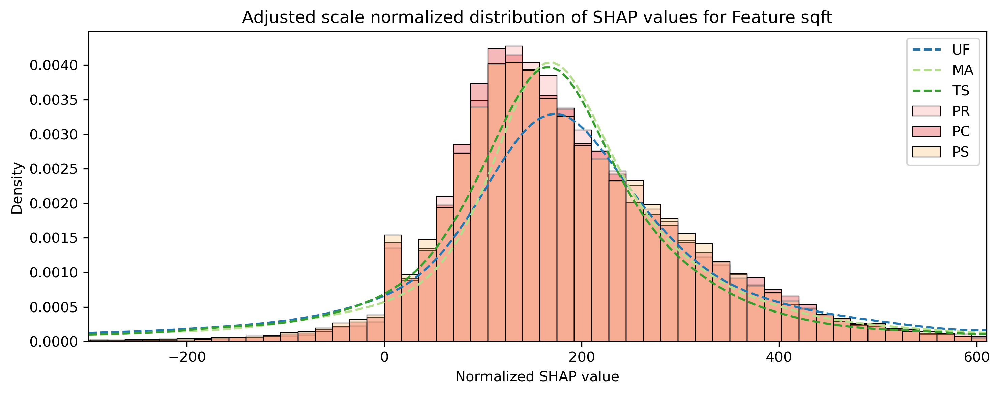

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import ks_2samp, skew, kurtosis
import ipywidgets as widgets
from IPython.display import display
from post_exp import load_shap_values, load_shap_values_pair, compute_normalized_shap_differences, compute_normalized_shap_differences_pairwise

# Setup
matplotlib.rcParams["figure.dpi"] = 300

method_short_names = {
    'Uniform': 'UF',
    'Marginal-all': 'MA',
    'TreeShap-treepath': 'TS',
}

method_short_names_pairs = {
    'Pairwise-random': 'PR',
    'Pairwise-comps': 'PC', 
    'Pairwise-sim': "PS"
}
dataset = 'kingcounty'
base_model_version = 'v3'
# Custom color map for six methods
custom_colors = ["#1f78b4", "#b2df8a", "#33a02c", "#fb9a99", "#e31a1c", "#fdbf6f"]

# Load SHAP values and other necessary data
shap_paths = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names.keys())))
shap_paths_pair = list(map(lambda method: f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl', list(method_short_names_pairs.keys())))
shap_values_list, feature_values = load_shap_values(shap_paths)
shap_values_list_pair, feature_values_pair = load_shap_values_pair(shap_paths_pair)

# Feature name list for the specific base model
feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()
num_features = len(feature_names)

# For non-pairwise methods, create random pairs and calculate the normalized Shapley distribution
num_pairs = 50
normalized_diffs, _, _, _ = compute_normalized_shap_differences(shap_values_list, 
                                                                feature_values, 
                                                                list(method_short_names.keys()), 
                                                                feature_names, 
                                                                num_pairs=num_pairs,
                                                                random_seed=42)

# For pairwise methods, compute the normalized Shapley differences
normalized_diffs_pair = compute_normalized_shap_differences_pairwise(shap_values_list_pair, 
                                                                     feature_values_pair, 
                                                                     list(method_short_names_pairs.keys()))

# Combine the two dictionaries into one
normalized_diffs.update(normalized_diffs_pair)

feature_idx = feature_names.index('sqft')
methods_to_plot = list(method_short_names.keys()) + list(method_short_names_pairs.keys())

# Create checkboxes for each method with hist and kde options
method_widgets = {}
for method_name in methods_to_plot:
    short_name = method_short_names.get(method_name, method_short_names_pairs.get(method_name))
    method_widgets[method_name] = {
        'hist': widgets.Checkbox(value=True, description=f'{short_name} - hist'),
        'kde': widgets.Checkbox(value=True, description=f'{short_name} - kde')
    }

# Display the checkboxes in an organized manner
grid = widgets.GridBox(
    children=[widget for mw in method_widgets.values() for widget in mw.values()],
    layout=widgets.Layout(
        grid_template_columns="repeat(2, 300px)",
        grid_gap="10px 10px"
    )
)
display(grid)

# Function to plot the clipped distribution with options for histograms and KDEs
def plot_distributions():
    plt.figure(figsize=(10, 4))
    # plt.figure(figsize=(12, 6))
    data = []
    header = ["Method Name", "Feature Name", "Count", "Mean", "Std", "Min", "25%", "50%", "75%", "Max", "Skew", "Kurtosis"]
    for method_name in methods_to_plot:
        clipped_values = np.clip(normalized_diffs[method_name][feature_idx], -700, 700)  # Clip the SHAP values
        
        if method_widgets[method_name]['hist'].value and method_name in method_short_names_pairs:
            sns.histplot(clipped_values, stat="density", bins=80, color=custom_colors[methods_to_plot.index(method_name)],
                         edgecolor='black', alpha=0.3, 
                         label=f'{method_short_names.get(method_name, method_short_names_pairs.get(method_name))}')
        
        if method_widgets[method_name]['kde'].value and method_name in method_short_names:
            sns.kdeplot(clipped_values, linestyle='--' if method_name in method_short_names else '-', 
                        color=custom_colors[methods_to_plot.index(method_name)], 
                        label=f'{method_short_names.get(method_name, method_short_names_pairs.get(method_name))}')
        
        # Calculate summary statistics
        stats = pd.Series(clipped_values).describe(percentiles=[.25, .5, .75])
        skewness = skew(clipped_values, axis=0, bias=True)
        kurt = kurtosis(clipped_values, axis=0, bias=True)
        stats = pd.concat([stats, pd.Series({'skew': skewness, 'kurtosis': kurt})])

        data.append([method_name, 
                     feature_names[feature_idx],
                     round(stats['count'], 2), 
                     round(stats['mean'], 2), 
                     round(stats['std'], 2), 
                     round(stats['min'], 2), 
                     round(stats['25%'], 2), 
                     round(stats['50%'], 2), 
                     round(stats['75%'], 2), 
                     round(stats['max'], 2), 
                     round(stats['skew'], 2), 
                     round(stats['kurtosis'], 2)])

    plt.xlim(-300, 610)
    plt.title(f'Adjusted scale normalized distribution of SHAP values for Feature {feature_names[feature_idx]}')
    plt.xlabel('Normalized SHAP value')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    # plt.show()
    plot_path = os.path.join(f"../results/{dataset}/base_model_{base_model_version}", 
                         f'normalized_shap_distribution_{feature_names[feature_idx]}_pair.pdf')
    plt.savefig(plot_path)
    print('\n', tabulate(data, headers=header, tablefmt="pretty"))

# Function to update plot based on selected checkboxes
def update_plot(change=None):
    plot_distributions()

# Attach the update function to method checkboxes
for mw in method_widgets.values():
    for widget in mw.values():
        widget.observe(update_plot, names='value')

# Initial plot
update_plot()

In [43]:
# S3-1 Beeswarm
import shap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from post_exp import load_shap_values, load_shap_values_pair
import matplotlib
import os
matplotlib.rcParams["figure.dpi"] = 300
import matplotlib.ticker as ticker

def plot_shap_beeswarm(save_dir, feature, method_list, shap_values_list, feature_values_list, feature_names, method_short_names, colormap='seismic'):
    # Determine the index of the feature
    feature_idx = feature_names.index(feature)

    combined_shap_values = []
    combined_feature_values = []
    combined_method_names = []

    for method, shap_values, feature_values in zip(method_list, shap_values_list, feature_values_list):
        method_shap_values = np.array(shap_values)[:, feature_idx]
        feature_vals = feature_values[:, feature_idx]
        method_name_vals = np.array([method_short_names[method]] * len(method_shap_values))
        
        combined_shap_values.append(method_shap_values)
        combined_feature_values.append(feature_vals)
        combined_method_names.append(method_name_vals)

    # Concatenate lists into arrays
    combined_shap_values = np.concatenate(combined_shap_values)
    combined_feature_values = np.concatenate(combined_feature_values)
    combined_method_names = np.concatenate(combined_method_names)

    # Determine the largest absolute value for normalization
    abs_max = max(abs(combined_feature_values.min()), abs(combined_feature_values.max()))
    norm = plt.Normalize(vmin=-abs_max, vmax=abs_max)

    # Create a color map with diverging colors from white at zero
    cmap = plt.get_cmap(colormap)

    fig, ax = plt.subplots(figsize=(6, len(method_list) * 0.6))
    
    # Set the x-axis to always show numbers in 1e6 format
    formatter = ticker.ScalarFormatter(useMathText=True)
    formatter.set_powerlimits((6, 6))  # Always enforce 10^6 notation
    ax.xaxis.set_major_formatter(formatter)

    # Order methods ensuring pairwise methods are at the bottom
    pairwise_methods = {'PR', 'PC', 'PS'}
    # pairwise_methods = {'PR', 'PS'}
    unique_methods = list(pairwise_methods) + [m for m in np.unique(combined_method_names) if m not in pairwise_methods] 
    
    # Create jitter for y-axis
    jitter_strength = 0.1
    method_positions = {method: i for i, method in enumerate(unique_methods)}
    jitter = lambda size : jitter_strength * np.random.randn(size)

    # Plot each method's SHAP values
    for method in unique_methods:
        method_mask = combined_method_names == method
        y_positions = method_positions[method] + jitter(sum(method_mask))

        ax.scatter(
            combined_shap_values[method_mask],
            y_positions,
            c=cmap(norm(combined_feature_values[method_mask])),
            alpha=0.7,
            edgecolor="k",
            linewidth=0.2,
        )

    # Add vertical line at x=0
    ax.axvline(0, color='grey', linestyle='--', linewidth=0.8)

    # Configure y-axis
    ax.set_yticks(list(method_positions.values()))
    ax.set_yticklabels(list(method_positions.keys()), fontsize=14)

    # Configure plot
    ax.set_xlabel("Shapley value", fontsize=16)
    ax.set_ylabel("Method", fontsize=16)
    ax.set_title(f"Feature: {feature}", fontsize=18)

    # Create and add the colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array(combined_feature_values)
    cbar = fig.colorbar(sm, orientation="vertical", label=f"(Relative) {feature} value", ax=ax)
    cbar.ax.tick_params(labelsize=14)
    cbar.set_label(f"(Relative) {feature} value", fontsize=16)
    
    plt.tight_layout()
    # plt.show()
    plt.savefig(os.path.join(save_dir, 
                         f'beeswarm_{feature}_v2.pdf'))

# Example usage
method_short_names = {
    'Baseline-0': 'B0',
    'Baseline-median': 'BM',
    'Uniform': 'UF',
    'Conditional-all': 'CA',
    'Marginal-all': 'MA',
    'Marginal-kmeans': 'MK',
    'TreeShap-treepath': 'TS',
}

method_short_names_pairs = {
    'Pairwise-random': 'PR',
    'Pairwise-comps': 'PC', 
    'Pairwise-sim': "PS"
}
dataset = 'kingcounty'
base_model_version = 'v3'
# Load SHAP values
shap_paths = [f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl' for method in method_short_names.keys()]
shap_paths_pair = [f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl' for method in method_short_names_pairs.keys()]

shap_values_list, feature_values = load_shap_values(shap_paths)
shap_values_list_pair, feature_values_pair = load_shap_values_pair(shap_paths_pair)

# Repeat feature_values to match the number of methods in method_short_names
repeated_feature_values = [feature_values for _ in method_short_names]

# Combine lists correctly
combined_method_list = list(method_short_names.keys()) + list(method_short_names_pairs.keys())
combined_shap_values_list = shap_values_list + shap_values_list_pair
combined_feature_values_list = repeated_feature_values + feature_values_pair  # Now combined as a list of arrays

feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()

save_dir = f"../results/{dataset}/base_model_{base_model_version}"
# Example call to the plotting function
plot_shap_beeswarm(save_dir,'sqft', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'grade', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'view_lakewash', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'city_BELLEVUE', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'noise_traffic', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})


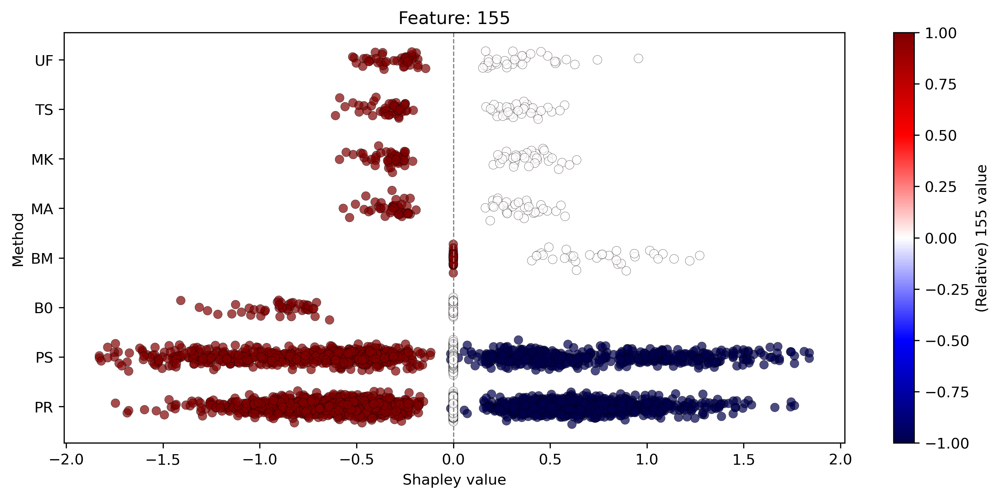

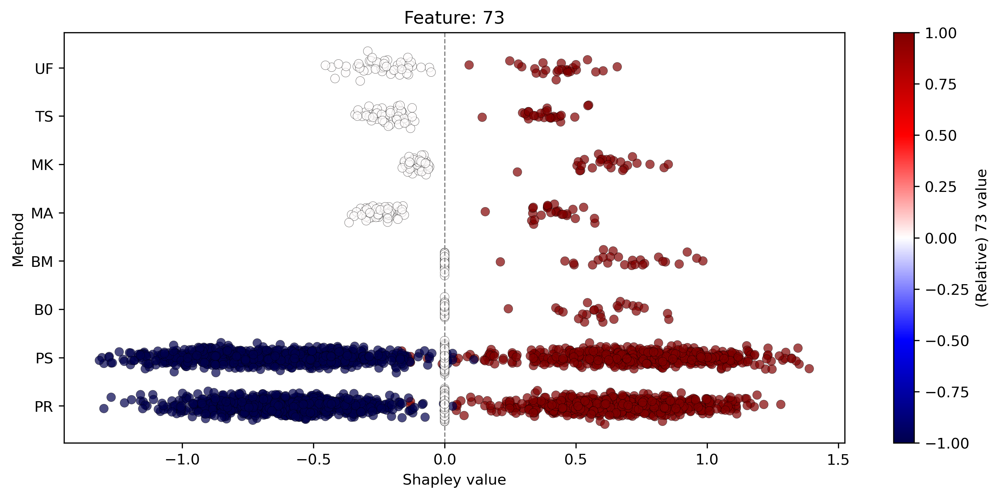

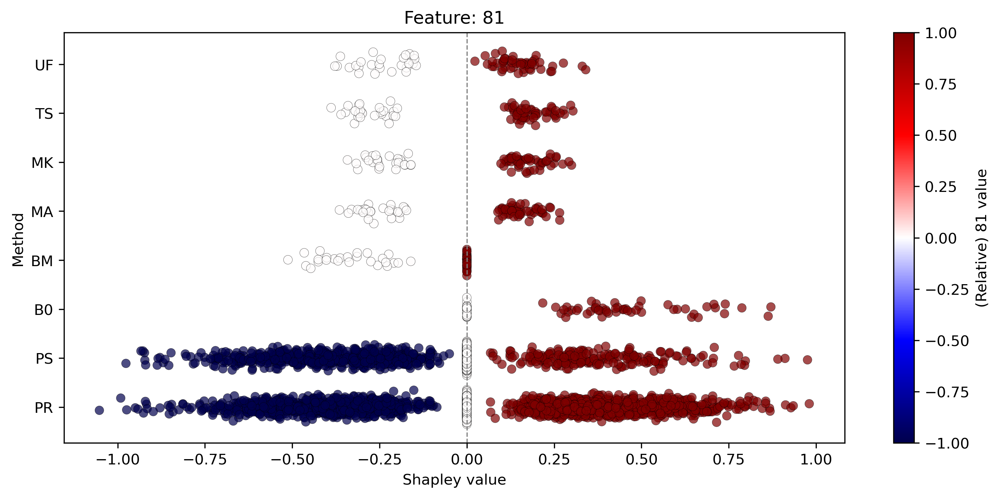

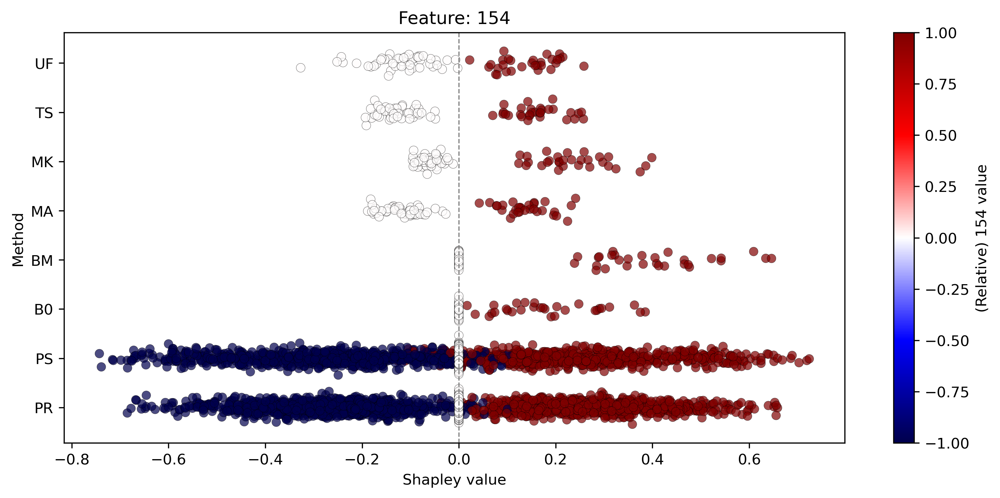

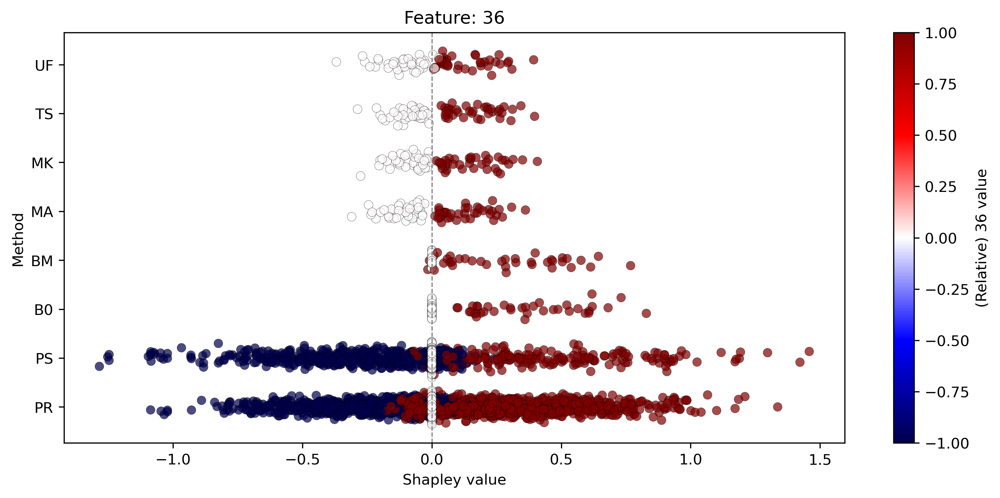

In [23]:

# Example usage
method_short_names = {
    'Baseline-0': 'B0',
    'Baseline-median': 'BM',
    'Uniform': 'UF',
    # 'Conditional-all': 'CA',
    'Marginal-all': 'MA',
    'Marginal-kmeans': 'MK',
    'TreeShap-treepath': 'TS',
}

method_short_names_pairs = {
    'Pairwise-random': 'PR',
    # 'Pairwise-comps': 'PC', 
    'Pairwise-sim': "PS"
}
dataset = 'polymer'
base_model_version = 'v0'
# Load SHAP values
shap_paths = [f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl' for method in method_short_names.keys()]
shap_paths_pair = [f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl' for method in method_short_names_pairs.keys()]

shap_values_list, feature_values = load_shap_values(shap_paths)
shap_values_list_pair, feature_values_pair = load_shap_values_pair(shap_paths_pair)

# Repeat feature_values to match the number of methods in method_short_names
repeated_feature_values = [feature_values for _ in method_short_names]

# Combine lists correctly
combined_method_list = list(method_short_names.keys()) + list(method_short_names_pairs.keys())
combined_shap_values_list = shap_values_list + shap_values_list_pair
combined_feature_values_list = repeated_feature_values + feature_values_pair  # Now combined as a list of arrays

feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()

save_dir = f"../results/{dataset}/base_model_{base_model_version}"
# Example call to the plotting function
plot_shap_beeswarm(save_dir, '155', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir, '73', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir, '81', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir, '154', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir, '36', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})


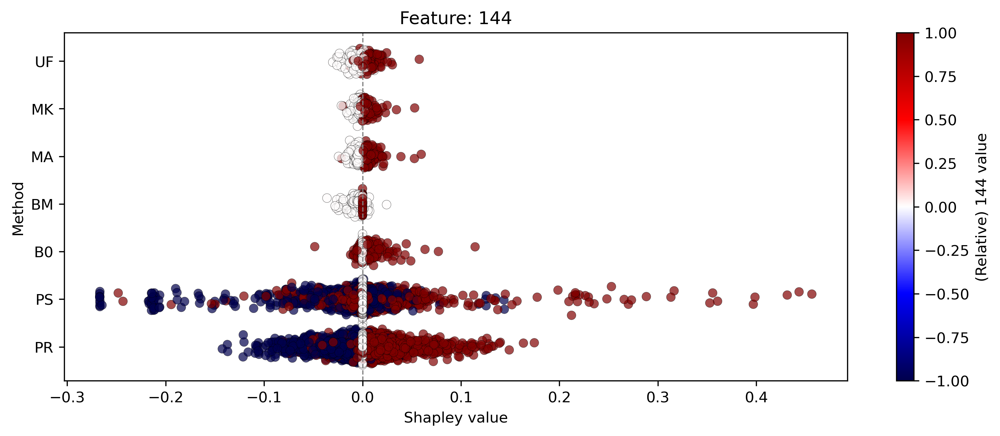

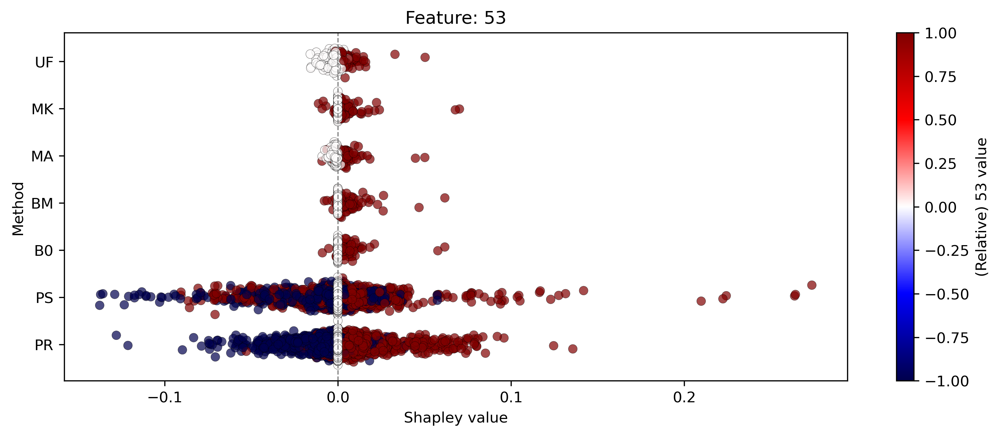

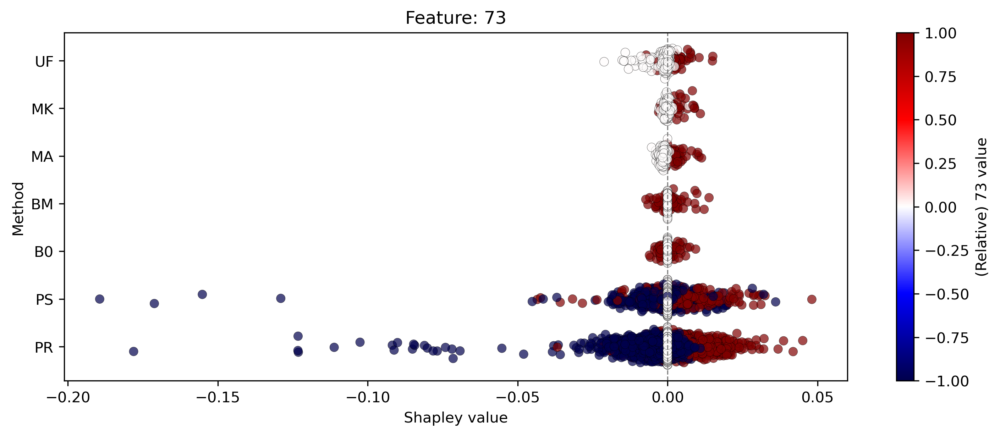

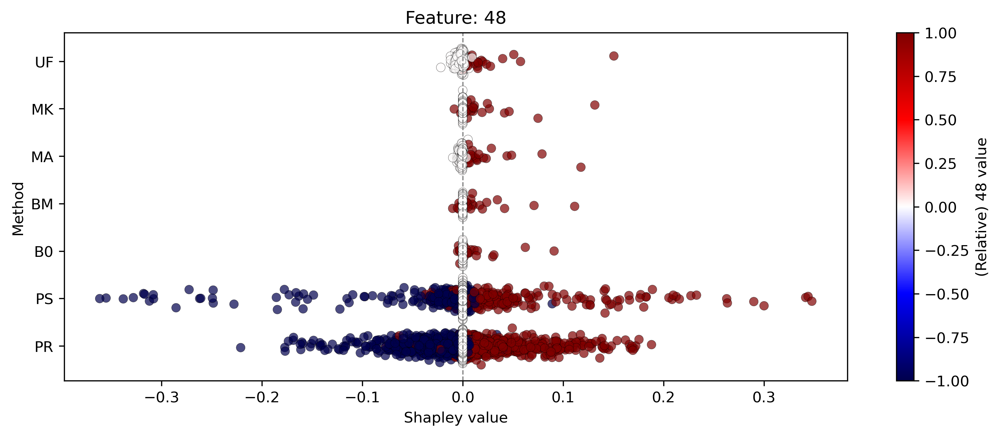

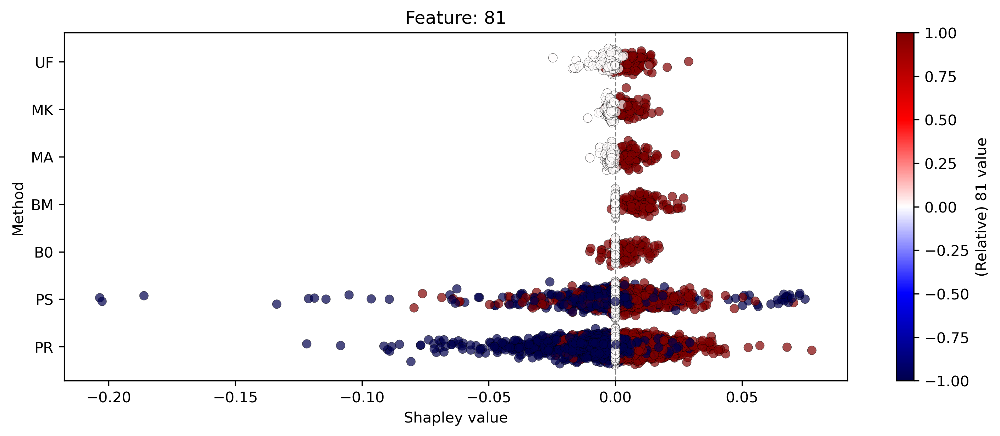

In [24]:

# Example usage
method_short_names = {
    'Baseline-0': 'B0',
    'Baseline-median': 'BM',
    'Uniform': 'UF',
    # 'Conditional-all': 'CA',
    'Marginal-all': 'MA',
    'Marginal-kmeans': 'MK',
    # 'TreeShap-treepath': 'TS',
}

method_short_names_pairs = {
    'Pairwise-random': 'PR',
    # 'Pairwise-comps': 'PC', 
    'Pairwise-sim': "PS"
}
dataset = 'hiv'
base_model_version = 'v0'
# Load SHAP values
shap_paths = [f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl' for method in method_short_names.keys()]
shap_paths_pair = [f'../results/{dataset}/base_model_{base_model_version}/{method}/shap_values.pkl' for method in method_short_names_pairs.keys()]

shap_values_list, feature_values = load_shap_values(shap_paths)
shap_values_list_pair, feature_values_pair = load_shap_values_pair(shap_paths_pair)

# Repeat feature_values to match the number of methods in method_short_names
repeated_feature_values = [feature_values for _ in method_short_names]

# Combine lists correctly
combined_method_list = list(method_short_names.keys()) + list(method_short_names_pairs.keys())
combined_shap_values_list = shap_values_list + shap_values_list_pair
combined_feature_values_list = repeated_feature_values + feature_values_pair  # Now combined as a list of arrays

feature_names = pd.read_csv(f'../results/{dataset}/base_model_{base_model_version}/X_test.csv', nrows=0).columns.tolist()
save_dir = f"../results/{dataset}/base_model_{base_model_version}"
# Example call to the plotting function
plot_shap_beeswarm(save_dir,'144', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'53', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'73', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'48', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})
plot_shap_beeswarm(save_dir,'81', combined_method_list, combined_shap_values_list, combined_feature_values_list, feature_names, {**method_short_names, **method_short_names_pairs})


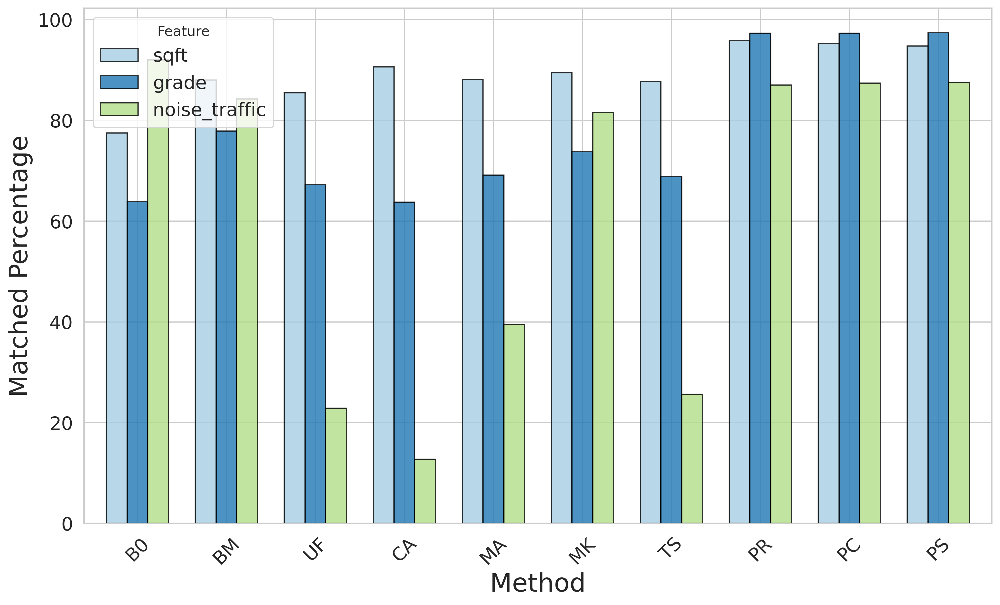

In [17]:
# S3-2 Monotonicity percentage accuracy
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300

dataset = "kingcounty"
base_model_version = "v3"
# Load data
file_path = f'../results/{dataset}/base_model_{base_model_version}/post_exp_results/monotonicity_results.csv'
df = pd.read_csv(file_path)

# Select useful columns
useful_cols = ["method", "feature", 
               "(+,+)_count", "(+,+)_ratio", "(+,-)_count", "(+,-)_ratio", "(+,0)_count", "(+,0)_ratio", 
               "(-,+)_count", "(-,+)_ratio", "(-,-)_count", "(-,-)_ratio", "(-,0)_count", "(-,0)_ratio",
               "(0,+)_count", "(0,+)_ratio", "(0,-)_count", "(0,-)_ratio", "(0,0)_count", "(0,0)_ratio"]
df = df[useful_cols]

# Selected features
positive_features = ["sqft", "grade"]
negative_feature = "noise_traffic"
selected_features = positive_features + [negative_feature]

# Convert ratios to percentages and round to 2 decimals
for col in df.columns:
    if 'ratio' in col:
        df[col] = (df[col] * 100).round(2)

# Method short names
method_short_names = {
    'Baseline-0': 'B0',
    'Baseline-median': 'BM',
    'Uniform': 'UF',
    'Conditional-all': 'CA',
    'Marginal-all': 'MA',
    'Marginal-kmeans': 'MK',
    'TreeShap-treepath': 'TS',
    'Pairwise-random': 'PR',
    'Pairwise-comps': 'PC', 
    'Pairwise-sim': "PS"
}

# Replace method names with short names
df['method'] = df['method'].map(method_short_names)

# Group matched pairs
def group_monotonicity(df, match_groups):
    df['matched_percentage'] = df[match_groups].sum(axis=1)
    return df[['method', 'feature', 'matched_percentage']]

# Define match groups for positive and negative features
match_positive = ["(+,+)_ratio", "(-,-)_ratio", "(0,0)_ratio"]
match_negative = ["(+,-)_ratio", "(-,+)_ratio", "(0,0)_ratio"]

# Calculate the matched percentages for each feature
grouped_data = pd.DataFrame()
for feature in selected_features:
    feature_df = df[df['feature'] == feature].copy()
    
    if feature in positive_features:
        feature_grouped = group_monotonicity(feature_df, match_positive)
    else:
        feature_grouped = group_monotonicity(feature_df, match_negative)
    
    grouped_data = pd.concat([grouped_data, feature_grouped], axis=0)

# Ensure pairwise methods are on the right
ordered_methods = [mn for mn in method_short_names.values() if mn not in ["PR", "PC", "PS"]] + ["PR", "PC", "PS"]
grouped_data['method'] = pd.Categorical(grouped_data['method'], categories=ordered_methods, ordered=True)

# Create a pivot table for plotting
pivot_data = grouped_data.pivot(index='method', columns='feature', values='matched_percentage').fillna(0)

# Reorder columns so that positive features come first
pivot_data = pivot_data[positive_features + [negative_feature]]

# Define custom colors
custom_colors = ["#a6cee3","#1f78b4","#b2df8a"]

# Plot grouped bar plot
ax = pivot_data.plot(kind='bar', figsize=(14, 8), color=custom_colors, width=0.7, edgecolor='black', alpha=0.8)
# plt.title('Monotonicity Accuracy Percentages (Matched Ratios) by Method and Feature', fontsize=18)
plt.xlabel('Method', fontsize=22)
plt.ylabel('Matched Percentage', fontsize=22)
plt.xticks(rotation=45, fontsize=16)
plt.yticks(fontsize=16)
plt.legend(title='Feature', fontsize=16)

plt.savefig(os.path.join(os.path.dirname(file_path), 
                         f'monotonicity_acc.pdf'))
plt.show()

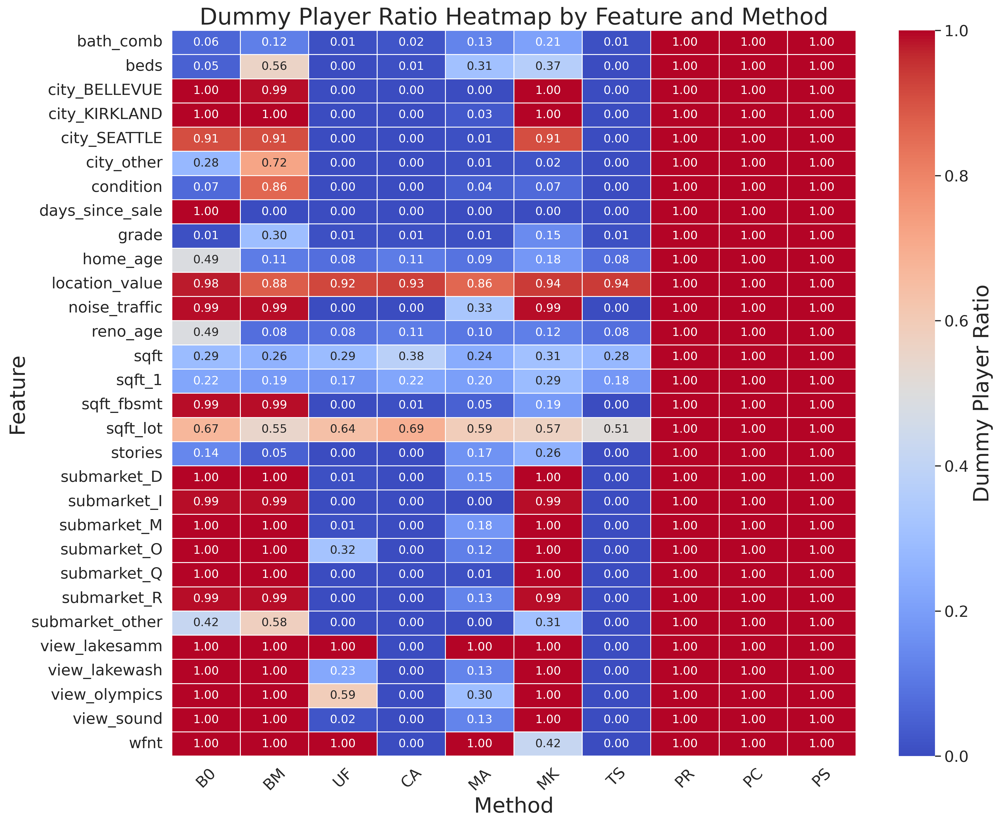

In [21]:
# S4 Dummmy Player Accuracy
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300

dataset = "kingcounty"
base_model_version = "v3"
# Load data
file_path = f'../results/{dataset}/base_model_{base_model_version}/post_exp_results/monotonicity_results.csv'
df = pd.read_csv(file_path)

# Method short names
method_short_names = {
    'Baseline-0': 'B0',
    'Baseline-median': 'BM',
    'Uniform': 'UF',
    'Conditional-all': 'CA',
    'Marginal-all': 'MA',
    'Marginal-kmeans': 'MK',
    'TreeShap-treepath': 'TS',
    'Pairwise-random': 'PR',
    'Pairwise-comps': 'PC', 
    'Pairwise-sim': 'PS'
}

# Replace method names with short names
df['method'] = df['method'].map(method_short_names)

# Calculate dummy player ratios
df['dummy_player_ratio'] = df['(0,0)_count'] / (df['(+,0)_count'] + df['(-,0)_count'] + df['(0,0)_count'])
df['dummy_player_ratio'] = df['dummy_player_ratio'].round(2)

# Ensure pairwise methods are on the right
ordered_methods = [mn for mn in method_short_names.values() if mn not in ["PR", "PC", "PS"]] + ["PR", "PC", "PS"]
df['method'] = pd.Categorical(df['method'], categories=ordered_methods, ordered=True)

# Create a pivot table for the heatmap
heatmap_data = df.pivot(index='feature', columns='method', values='dummy_player_ratio')

# Define the subset of features you want to include (optional)
# subset_features = ['feature1', 'feature2', 'feature3', ...]  # Replace with your actual feature names
# df = df[df['feature'].isin(subset_features)]

# Plot the heatmap
plt.figure(figsize=(15, 12))
sns.set(style="whitegrid")
heatmap = sns.heatmap(heatmap_data, annot=True, fmt=".2f", 
                      cmap="coolwarm", linewidths=.5,
                      cbar_kws={'label': 'Dummy Player Ratio'})
cbar = heatmap.collections[0].colorbar
cbar.set_label('Dummy Player Ratio', fontsize=22)  # Set the color bar label font size
cbar.ax.tick_params(labelsize=16)  # Set the color bar tick labels font size

plt.title('Dummy Player Ratio Heatmap by Feature and Method', fontsize=24)
plt.xlabel('Method', fontsize=22)
plt.xticks(rotation=45, fontsize=16)
plt.ylabel('Feature', fontsize=22)
plt.yticks(fontsize=16)
plt.tight_layout()

# Save the plot (specify your output directory)
# output_dir = '../results/base_model_10/post_exp_results/'  # Ensure this directory exists
# plt.savefig(os.path.join(output_dir, 'dummy_player_heatmap.png'))

plt.savefig(os.path.join(os.path.dirname(file_path), 
                         f'dummy_player.pdf'))
plt.show()

/tmp/ipykernel_174/1877070699.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=16)
/tmp/ipykernel_174/1877070699.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=16)
/tmp/ipykernel_174/1877070699.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=16)


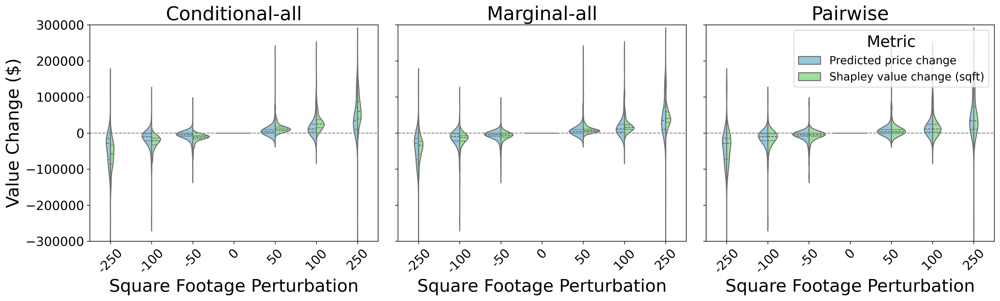

In [45]:
# S5 Perturbation test
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300
import os
dataset = "kingcounty"
base_model_version = "v3"
# Define the directories for the results
method_dirs = {
    'Conditional-all': f'../results/{dataset}/base_model_{base_model_version}/explain_perturb/Conditional-all/',
    'Marginal-all': f'../results/{dataset}/base_model_{base_model_version}/explain_perturb/Marginal-all/',
    'Pairwise': f'../results/{dataset}/base_model_{base_model_version}/explain_perturb/Pairwise/'
}

# A list to gather DataFrame for each method
dfs = []

# Loop through each method directory and read the perturbation_results.csv file
for method_name, method_dir in method_dirs.items():
    file_path = f'{method_dir}/perturbation_results.csv'
    df = pd.read_csv(file_path)
    df['Method'] = method_name  # Add a new column to indicate the method
    dfs.append(df)

# Combine all DataFrames
combined_df = pd.concat(dfs, axis=0)
# Remove data points where sqft_perturbation is ±500
combined_df = combined_df[~combined_df['sqft_perturbation'].isin([500, -500])]

# Melt the combined DataFrame for easier plotting with seaborn
melted_df = combined_df.melt(id_vars=["sqft_perturbation", "Method"], 
                             value_vars=["predicted_price_change", "shap_value_sqft_change"],
                             var_name="Metric", 
                             value_name="Value")
custom_metric_labels = {
    "predicted_price_change": "Predicted price change",
    "shap_value_sqft_change": "Shapley value change (sqft)"
}
# Map the custom labels
melted_df["Metric"] = melted_df["Metric"].map(custom_metric_labels)
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Define method order for subplots
methods = ['Conditional-all', 'Marginal-all', 'Pairwise']

# Plot each method in a separate subplot
for ax, method in zip(axes, methods):
    sns.violinplot(
        x="sqft_perturbation", 
        y="Value", 
        hue="Metric", 
        data=melted_df[melted_df['Method'] == method], 
        split=True, 
        inner="quart", 
        palette={"Predicted price change": "skyblue", "Shapley value change (sqft)": "lightgreen"},
        ax=ax
    )
    ax.set_title(method, fontsize=24)
    ax.axhline(y=0, color='gray', linestyle='--', linewidth=1)
    ax.set_xlabel('Square Footage Perturbation', fontsize=22)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=16)
    ax.set_ylabel('Value Change ($)', fontsize=22) if ax == axes[0] else ax.set_ylabel('')
    ax.set_ylim([-300000, 300000])  # Set y-axis limits
    ax.tick_params(axis='y', labelsize=16)
    if method == 'Pairwise':
        ax.legend(title='Metric', loc='upper right', fontsize=14)
    else:
        ax.get_legend().remove()

# fig.suptitle('Distribution of Predicted Price Change and Shapley Value Change by Method', fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to make space for suptitle


# # Save the plot (adjust the output directory as needed)
output_dir = f"../results/{dataset}/base_model_{base_model_version}/explain_perturb"  # Ensure this directory exists
# os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, 'combined_sqft_perturb_violin_v2.pdf'), bbox_inches='tight')
plt.show()

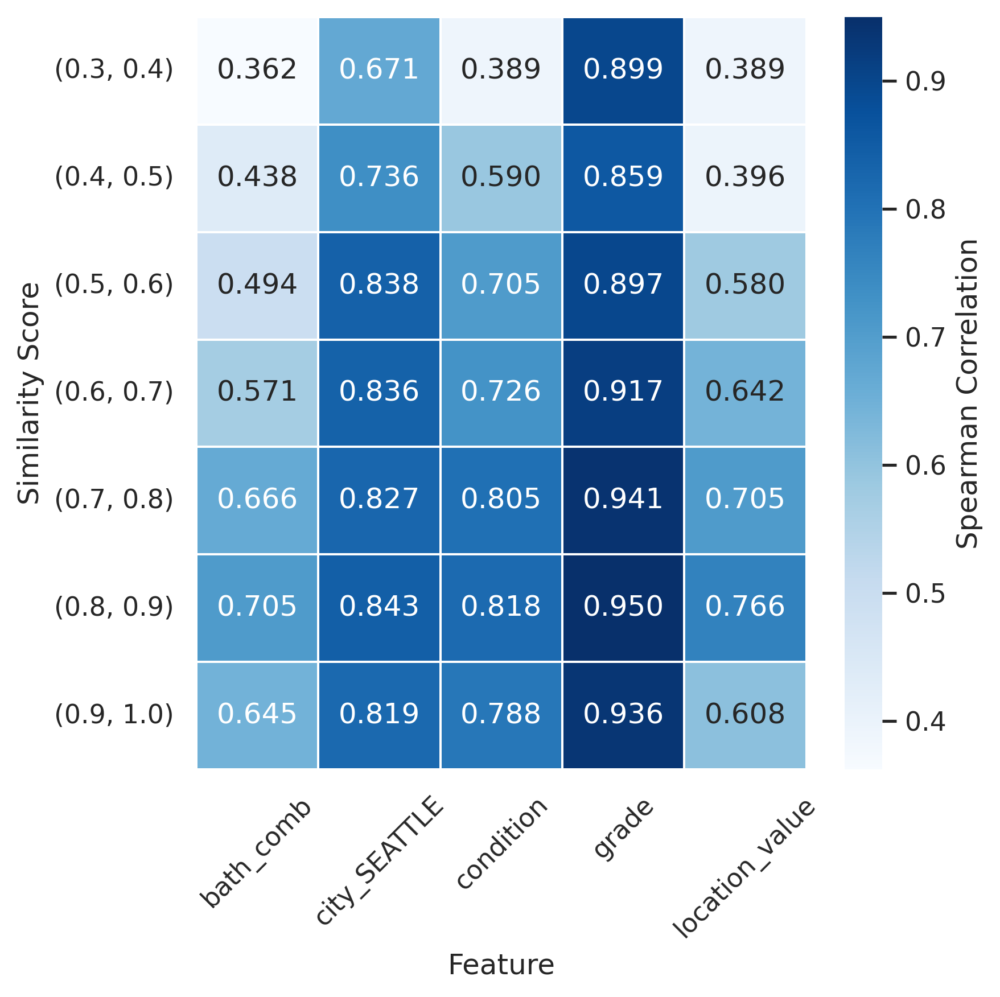

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300

def plot_conditional_accuracy_heatmap(file_path):
    # Load the data
    df_sim = pd.read_csv(file_path)
    
    # Method and features to include
    methods_to_include = ['Pairwise-random']
    features_to_include = ['grade', 'condition', 'location_value', 'city_SEATTLE', 'bath_comb']
    
    # Filter for specified method and features
    filtered_df = df_sim[(df_sim['method'].isin(methods_to_include)) & 
                         (df_sim['feature'].isin(features_to_include))]

    # Function to clean category strings and convert to float
    def clean_category_string(category_str):
        category_str = category_str.replace('(', '').replace(')', '').replace(' ', '').replace('[', '').replace(']', '')
        return list(map(float, category_str.split(',')))

    # Prepare plot data
    plot_data_list = []

    for feature in features_to_include:
        # Filter DataFrame for the current feature
        feature_df = filtered_df[filtered_df['feature'] == feature].copy()

        # Clean and convert category strings
        categories_cleaned = feature_df['category'].apply(clean_category_string)
        feature_df['category_tuple'] = categories_cleaned.apply(lambda x: f"({x[0]}, {x[1]})")

        # Append tuples of bin (category_tuple) and spearman_corr for plotting
        for spearman_corr, category in zip(feature_df['spearman_corr'], feature_df['category_tuple']):
            plot_data_list.append((category, feature, spearman_corr))

    # Create a DataFrame from the data collected
    plot_data = pd.DataFrame(plot_data_list, columns=["Similarity Score - Bins", "Feature", "Spearman Corr"])
    # Filter out the first three bins that have no data
    plot_data = plot_data.groupby("Spearman Corr").filter(lambda x: len(x) > 0)

    # Pivot the DataFrame for the heatmap format
    heatmap_data = plot_data.pivot(index="Similarity Score - Bins", columns="Feature", values="Spearman Corr")

    # Plot the heatmap
    plt.figure(figsize=(6, 6))
    sns.set(style="whitegrid")
    ax = sns.heatmap(heatmap_data, annot=True, fmt=".3f", cmap="Blues", linewidths=.5, cbar_kws={'label': 'Spearman Correlation'})
    ax.set_ylabel('Similarity Score')
    ax.set_xlabel('Feature')
    # plt.title('Conditional Spearman Correlation by Features and Similarity Scores for Pairwise-random Method')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.savefig(os.path.join(os.path.dirname(file_path), 'sim_score.pdf'))
    plt.show()

dataset = "kingcounty"
base_model_version = "v3"
# Call the function with the specified file path
file_path = f'../results/{dataset}/base_model_{base_model_version}/post_exp_results/conditional_spearman_sim.csv'
plot_conditional_accuracy_heatmap(file_path)

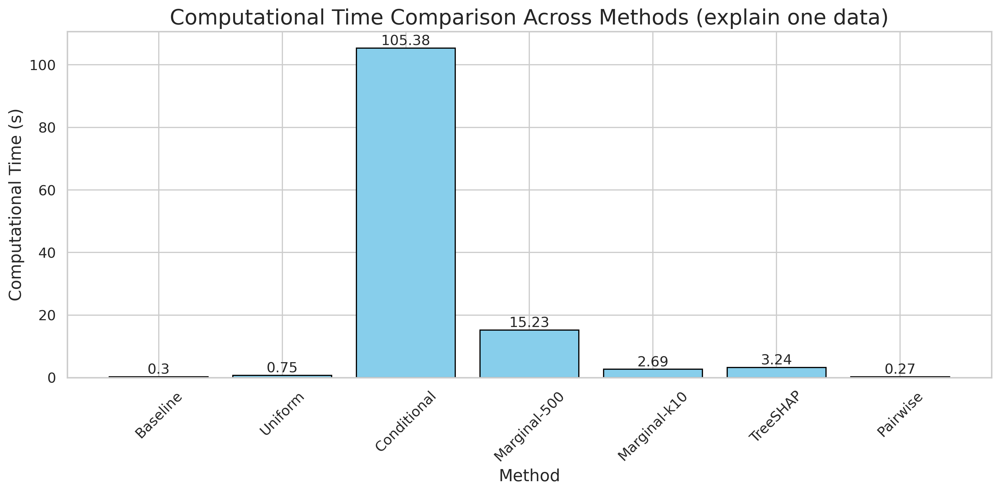

In [14]:
# S7 - Computational time
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300
# computational times (fill these with data from log file explain_singledata.log of each method)
computational_times = {
    'Baseline': 0.30,
    'Uniform': 0.75,
    'Conditional': 105.38,
    'Marginal-500': 15.23,
    'Marginal-k10': 2.69,
    'TreeSHAP': 3.24,
    'Pairwise': 0.27
}

# Convert the dictionary to lists for plotting
methods = list(computational_times.keys())
times = list(computational_times.values())

# Plot the data
plt.figure(figsize=(12, 6))
bars = plt.bar(methods, times, color='skyblue', edgecolor='black')
plt.xlabel('Method', fontsize=14)
plt.ylabel('Computational Time (s)', fontsize=14)
plt.title('Computational Time Comparison Across Methods (explain one data)', fontsize=18)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Annotate the bars with their respective values
for bar, time in zip(bars, times):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{time}', 
             ha='center', va='bottom', fontsize=12)
    
plt.tight_layout()

# Save the plot (specify your output directory)
# output_dir = '../results/base_model_10/combined_plots/'  # Ensure this directory exists
# os.makedirs(output_dir, exist_ok=True)
# plt.savefig(os.path.join(output_dir, 'computational_time_comparison.png'), bbox_inches='tight')
dataset = "kingcounty"
base_model_version = "v3"
# Call the function with the specified file path
file_path = f'../results/{dataset}/base_model_{base_model_version}'
plt.savefig(os.path.join(file_path, 'comp_time.pdf'))
plt.show()


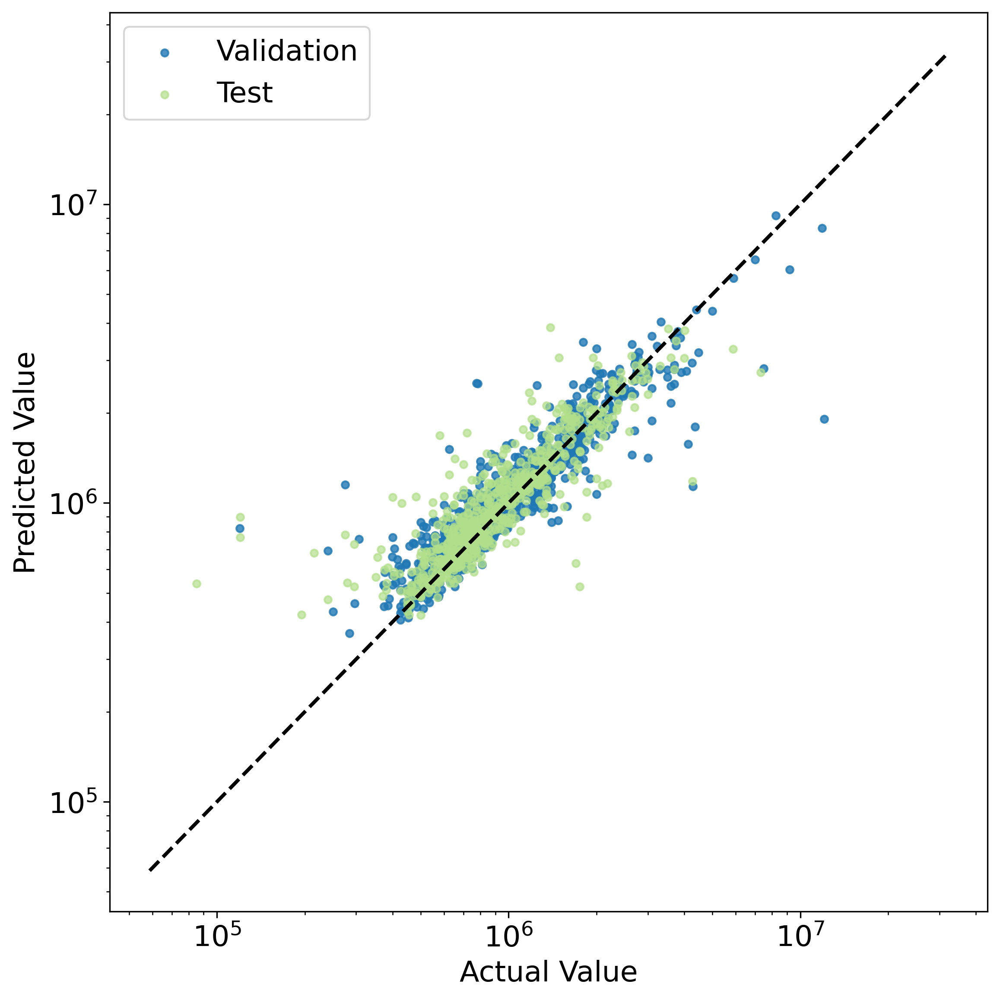

In [1]:
# Visualize prediction performance (regression and classification)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define file paths
results_dir = "../results/kingcounty/base_model_v3"  # Adjust to your actual results directory

y_test_pred_file = f"{results_dir}/y_test_pred.npy"
y_val_pred_file = f"{results_dir}/y_val_pred.npy"
y_train_pred_file = f"{results_dir}/y_train_pred.npy"

y_train_val_combined_file = f"{results_dir}/y_train_val_combined.csv"
y_test_truth_file = f"{results_dir}/y_test.csv"

# Load predictions
y_test_pred = np.load(y_test_pred_file)
y_val_pred = np.load(y_val_pred_file)
y_train_pred = np.load(y_train_pred_file)

# Load ground truth
y_train_val_combined = pd.read_csv(y_train_val_combined_file).values.flatten()
y_test = pd.read_csv(y_test_truth_file).values.flatten()

# Split y_train_val_combined back into train and validation based on lengths
split_idx = len(y_train_pred)
y_train = y_train_val_combined[:split_idx]
y_val = y_train_val_combined[split_idx:]

# colors = ['#7fc97f','#beaed4','#fdc086']
# colors = ['#1b9e77','#d95f02','#7570b3']
colors = ['#a6cee3','#1f78b4','#b2df8a']

# Set font sizes
font_size = 16
plt.rcParams.update({
    'font.size': font_size,        # General font size
    'axes.titlesize': font_size,  # Title font size
    'axes.labelsize': font_size,  # X/Y label font size
    'xtick.labelsize': font_size, # X-axis tick font size
    'ytick.labelsize': font_size, # Y-axis tick font size
    'legend.fontsize': font_size  # Legend font size
})

# Plot parity plot
plt.figure(figsize=(8, 8), dpi=300)
# plt.scatter(y_train, y_train_pred, label='Train', alpha=0.8, color=colors[0], s=16)
if y_val is not None:
    plt.scatter(y_val, y_val_pred, label='Validation', alpha=0.8,color=colors[1], s=16)
plt.scatter(y_test, y_test_pred, label='Test', alpha=0.7, color=colors[2], s=16)
plt.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         '--k', lw=2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Actual Value',)
plt.ylabel('Predicted Value')
# plt.title('Parity Plot (Log Scale)')
plt.tight_layout()
plt.grid(False)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'prediction_parity_plot_log_no_train.pdf'))


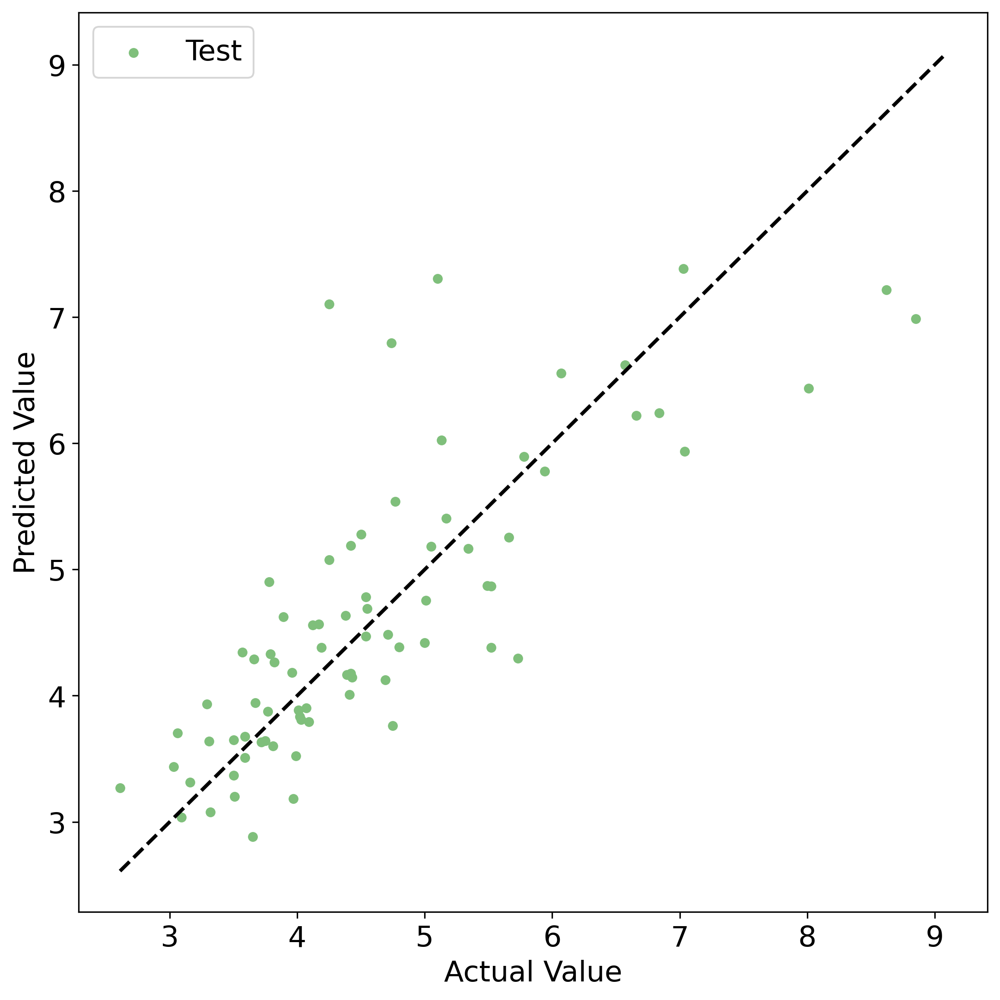

In [2]:
# Visualize prediction performance (regression and classification)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define file paths
results_dir = "../results/polymer/base_model_v0"  # Adjust to your actual results directory

y_test_pred_file = f"{results_dir}/y_test_pred.npy"
# y_val_pred_file = f"{results_dir}/y_val_pred.npy"
y_train_pred_file = f"{results_dir}/y_train_pred.npy"

y_train_val_combined_file = f"{results_dir}/y_train_val_combined.csv"
y_test_truth_file = f"{results_dir}/y_test.csv"

# Load predictions
y_test_pred = np.load(y_test_pred_file)
# y_val_pred = np.load(y_val_pred_file)
y_train_pred = np.load(y_train_pred_file)

# Load ground truth
y_train_val_combined = pd.read_csv(y_train_val_combined_file).values.flatten()
y_test = pd.read_csv(y_test_truth_file).values.flatten()

# Split y_train_val_combined back into train and validation based on lengths
split_idx = len(y_train_pred)
y_train = y_train_val_combined[:split_idx]
y_val = y_train_val_combined[split_idx:]

# colors = ['#7fc97f','#beaed4','#fdc086']
# colors = ['#1b9e77','#d95f02','#7570b3']
colors = ['#af8dc3','#1f78b4','#7fbf7b']

# Set font sizes
font_size = 16
plt.rcParams.update({
    'font.size': font_size,        # General font size
    'axes.titlesize': font_size,  # Title font size
    'axes.labelsize': font_size,  # X/Y label font size
    'xtick.labelsize': font_size, # X-axis tick font size
    'ytick.labelsize': font_size, # Y-axis tick font size
    'legend.fontsize': font_size  # Legend font size
})

# Plot parity plot
plt.figure(figsize=(8, 8), dpi=300)
# plt.scatter(y_train, y_train_pred, label='Train', alpha=1, color=colors[0], s=20)
# if y_val is not None:
#     plt.scatter(y_val, y_val_pred, label='Validation', alpha=0.8,color=colors[1], s=8)
plt.scatter(y_test, y_test_pred, label='Test', alpha=1, color=colors[2], s=20)
plt.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         '--k', lw=2)
# plt.xscale('log')
# plt.yscale('log')
plt.xlabel('Actual Value',)
plt.ylabel('Predicted Value')
# plt.title('Parity Plot (Log Scale)')
plt.tight_layout()
plt.grid(False)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'prediction_parity_plot_no_train.pdf'))


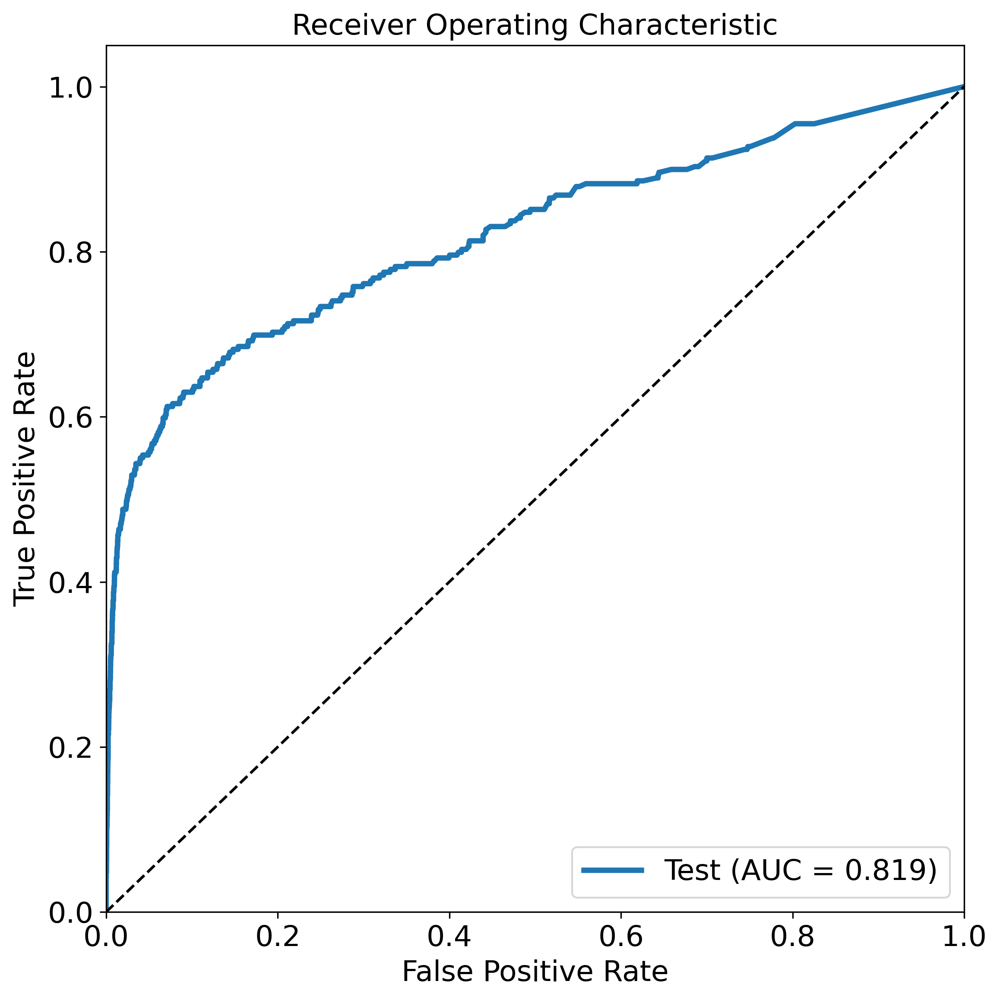

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, roc_curve
# Define file paths
results_dir = "../results/hiv/base_model_v0"  # Adjust to your actual results directory

y_test_pred_file = f"{results_dir}/y_test_pred_prob.npy"
# y_val_pred_file = f"{results_dir}/y_val_pred.npy"
y_train_pred_file = f"{results_dir}/y_train_pred_prob.npy"

y_train_val_combined_file = f"{results_dir}/y_train_val_combined.csv"
y_test_truth_file = f"{results_dir}/y_test.csv"

# Load predictions
y_test_prob = np.load(y_test_pred_file)
# y_val_pred = np.load(y_val_pred_file)
y_train_prob = np.load(y_train_pred_file)

# Load ground truth
y_train_val_combined = pd.read_csv(y_train_val_combined_file).values.flatten()
y_test = pd.read_csv(y_test_truth_file).values.flatten()

# Split y_train_val_combined back into train and validation based on lengths
split_idx = len(y_train_pred)
y_train = y_train_val_combined[:split_idx]
y_val = y_train_val_combined[split_idx:]

#Plot ROC curve for training and test data
plt.figure(figsize=(8, 8),dpi=300)
# Set font sizes
font_size = 16
plt.rcParams.update({
    'font.size': font_size,        # General font size
    'axes.titlesize': font_size,  # Title font size
    'axes.labelsize': font_size,  # X/Y label font size
    'xtick.labelsize': font_size, # X-axis tick font size
    'ytick.labelsize': font_size, # Y-axis tick font size
    'legend.fontsize': font_size  # Legend font size
})
# fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob[:, 1])
# roc_auc_train = roc_auc_score(y_train, y_train_prob[:, 1])
# plt.plot(fpr_train, tpr_train, label=f'Train (AUC = {roc_auc_train:.3f})', lw=3)

fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob[:, 1])
roc_auc_test = roc_auc_score(y_test, y_test_prob[:, 1])
plt.plot(fpr_test, tpr_test, label=f'Test (AUC = {roc_auc_test:.3f})', lw=3)

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'roc_curve_no_train.pdf'))